In [1]:
#import necessary libraries
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

from matplotlib.ticker import AutoMinorLocator

import xarray as xr
import scipy

from scipy import stats
from scipy.stats import pearsonr, linregress

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd

import time
from datetime import datetime, date

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.ticker import MaxNLocator, FuncFormatter
import matplotlib.dates as mdates


import shapefile
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings
import os

import sys
import os.path
import subprocess
import math
import csv

from netCDF4 import Dataset

#import s3fs
import copy
import json, copy
from pandas import DataFrame
from osgeo import gdal, ogr, osr

import warnings
warnings.filterwarnings("ignore")

In [2]:
#import necessary libraries
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

from matplotlib.ticker import AutoMinorLocator

import xarray as xr
import scipy

from scipy import stats
from scipy.stats import pearsonr, linregress

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd

import time
from datetime import datetime, date

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.ticker import MaxNLocator, FuncFormatter
import matplotlib.dates as mdates


import shapefile
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings
import os

import sys
import os.path
import subprocess
import math
import csv

from netCDF4 import Dataset

#import s3fs
import copy
import json, copy
from pandas import DataFrame
from osgeo import gdal, ogr, osr

import warnings
warnings.filterwarnings("ignore")

---------------

---------------

In [4]:
# 1. Load both CSVs

wgh = pd.read_csv(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/WGAP_HM/New_HMA_RegionalAvergaed_anomalies_wghTWS.csv', parse_dates=[0])
grace = pd.read_csv(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/New_EnsembleWeightedAverageMascon1.csv', parse_dates=[0])
# New_EnsembleWeightedAverageMascon1.csv

# 2. Ensure the date columns are named 'date' and are datetime
wgh = wgh.rename(columns={wgh.columns[0]: 'date'})
grace = grace.rename(columns={grace.columns[0]: 'date'})


# 3. Merge on date (outer join to keep all months)
df = pd.merge(grace, wgh, on='date', how='outer', suffixes=('_GRACE', '_WGH'))
df = df.sort_values('date').reset_index(drop=True)

# 4. Fill missing months (reindex to monthly frequency)
full_range = pd.date_range(df['date'].min(), df['date'].max(), freq='M')
df = df.set_index('date').reindex(full_range).rename_axis('date').reset_index()

# 5. Gap-fill each region using cubic interpolation (or SSA if you prefer)
for col in df.columns:
    if col != 'date':
        df[col] = df[col].interpolate(method='linear', limit_direction='both')

# 6. Identify region names (e.g., "Hindu Kush", "Western Himalaya", ...)
region_names = [col.replace('_GRACE', '') for col in df.columns if col.endswith('_GRACE')]

# 7. Compute glacier signal for each region
for region in region_names:
    df[f'{region}'] = df[f'{region}_GRACE'] - df[f'{region}_WGH'] #df[f'{region}_glacier'] = df[f'{region}_GRACE'] - df[f'{region}_WGH']
    #df[f'{region}'] = df[f'{region}_GRACE'] - df[f'{region}_GLDAS'] #df[f'{region}_glacier'] = df[f'{region}_GRACE'] - df[f'{region}_GLDAS']
    

# 8. Save the glacier signal for all regions
glacier_cols = ['date'] + [f'{region}' for region in region_names] #glacier_cols = ['date'] + [f'{region}_glacier' for region in region_names]
df[glacier_cols].to_csv('HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', index=False)

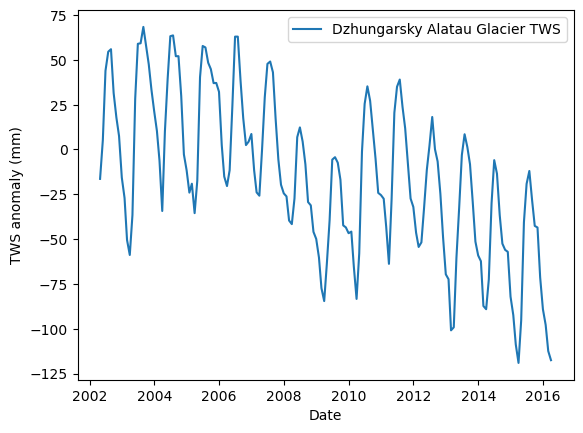

In [5]:
# 9. (Optional) Plot for one region
import matplotlib.pyplot as plt
plt.plot(df['date'], df[f'{region_names[0]}'], label=f'{region_names[0]} Glacier TWS')
plt.xlabel('Date')
plt.ylabel('TWS anomaly (mm)')
plt.legend()
plt.show()

In [6]:
# Open the CSV file, parsing the 'date' column as datetime if needed
# df = pd.read_csv('HMA_RegionalAveraged_TWS_GlacierSignal.csv', parse_dates=['date'])
df = pd.read_csv('HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', parse_dates=['date'])

# Rename the column 'date' to 'time'
df = df.rename(columns={'date': 'time'})

# (Optional) Save the updated DataFrame back to CSV
df.to_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', index=False)

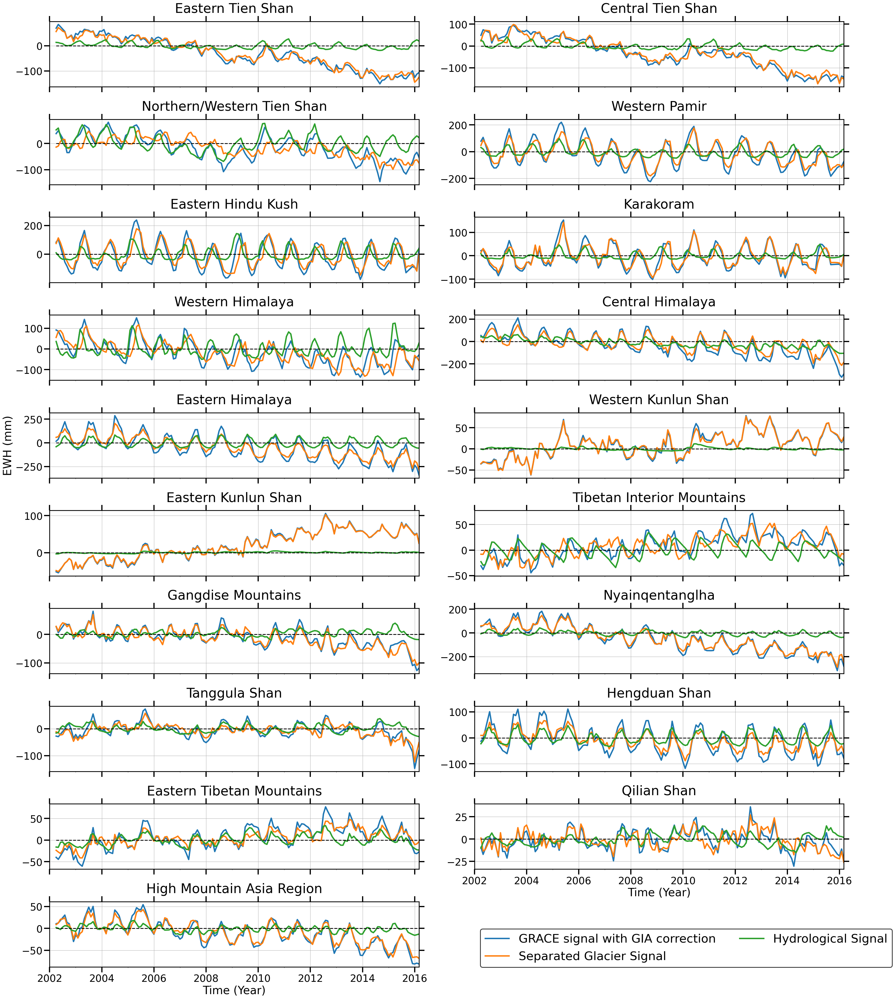

In [109]:
# Define datasets
datasets = {
    "GRACE signal with GIA correction": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/New_EnsembleWeightedAverageMascon1.csv",
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv", #date column renamed as time to make consistency with others
    "Hydrological Signal": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/WGAP_HM/New_HMA_RegionalAvergaed_anomalies_wghTWS.csv" #New_HMA_RegionalAvergaed_anomalies_wghTWS.csv
}

dataset_colors = {
    "GRACE signal with GIA correction": "#1f77b4",       # Blue
    "Separated Glacier Signal": "#ff7f0e",   # Orange
    "Hydrological Signal": "#2ca02c"         # Green
}

# Load region metadata
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha', 'Gangdise Mountains', 'Hengduan Shan',
        'Tibetan Interior Mountains', 'Tanggula Shan', 'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan',
        'Eastern Tien Shan', 'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load and preprocess all datasets
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]  # Ensure consistent region order

# # Create colormap for datasets
# colors = plt.cm.tab10(np.linspace(0, 1, len(datasets)))

# Setup figure
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

# Generate x-ticks
time_index = dfs[list(datasets.keys())[0]].index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

# Plot each region with all datasets
for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    region_id = row['region_id']
    ax = axes[i]
    
    # # Plot each dataset for current region
    # for j, (name, df) in enumerate(dfs.items()):
    #     df[region].plot(ax=ax, color=colors[j], label=name, linewidth=2)

    for name, df in dfs.items():
        df[region].plot(
            ax=ax,
            color=dataset_colors[name],
            label=name,
            linewidth=3.5
        )
    
    # ax.set_title(region, fontsize=22)
    ax.set_title(region, fontsize=33, pad=22)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    
    # ax.tick_params(axis='x', labelsize=22, direction='out', top=True, bottom=True, length=7.5, width=0.8)
    # ax.tick_params(axis='y', labelsize=22, direction='out', left=True, right=True, length=7.5, width=0.8)
    ax.tick_params(axis='x', labelsize=25, direction='out', top=True, bottom=True, length=14, width=3)
    ax.tick_params(axis='y', labelsize=25, direction='out', left=True, right=True, length=14, width=3)
    
    
    ax.hlines(0, time_index.min(), time_index.max(), colors='k', linestyles='--', linewidth=2)
    
    # # Add region ID
    # ax.text(0.95, 0.95, f"{region_id}", transform=ax.transAxes,
    #         fontsize=16, fontweight='bold', verticalalignment='top', horizontalalignment='left',
    #         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round, pad=0.2', linewidth=1))

for ax in axes:   #setting rectangular box for each subplot, adjusting the width of the edge of the box
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

# Add labels and legend
axes[8].set_ylabel('EWH (mm)', fontsize=28)

axes[17].set_xlabel('Time (Year)', fontsize=28)

axes[18].set_xlabel('Time (Year)', fontsize=28)

# Make sure x-tick labels are visible on bottom row axes
axes[17].tick_params(labelbottom=True)

axes[17].xaxis.get_label().set_visible(True)

# === LEGEND PLACEMENT ===
legend = axes[18].legend(
    list(datasets.keys()),
    loc='center left',
    bbox_to_anchor=(1.15, 0.29),  # Adjust horizontal position as needed
    ncol=2,
    fontsize=30,
    frameon=True
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)     

axes[18].tick_params(labelbottom=True)


# fig.legend(list(datasets.keys()), loc='lower center', 
#            bbox_to_anchor=(0.52, -0.03), ncol=5, fontsize=30)

# Remove unused subplots
for j in range(len(df.columns), len(axes)):
    fig.delaxes(axes[j])

# Final adjustments
plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)
plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_TimeSeries/GRACESignal_withGIA_corr_HYdrologicalSignalGlacierSignal_withAnomaliesWGH__timeseries_no_sharey_withoutEnvelope.png', dpi=300, bbox_inches='tight')

plt.show()

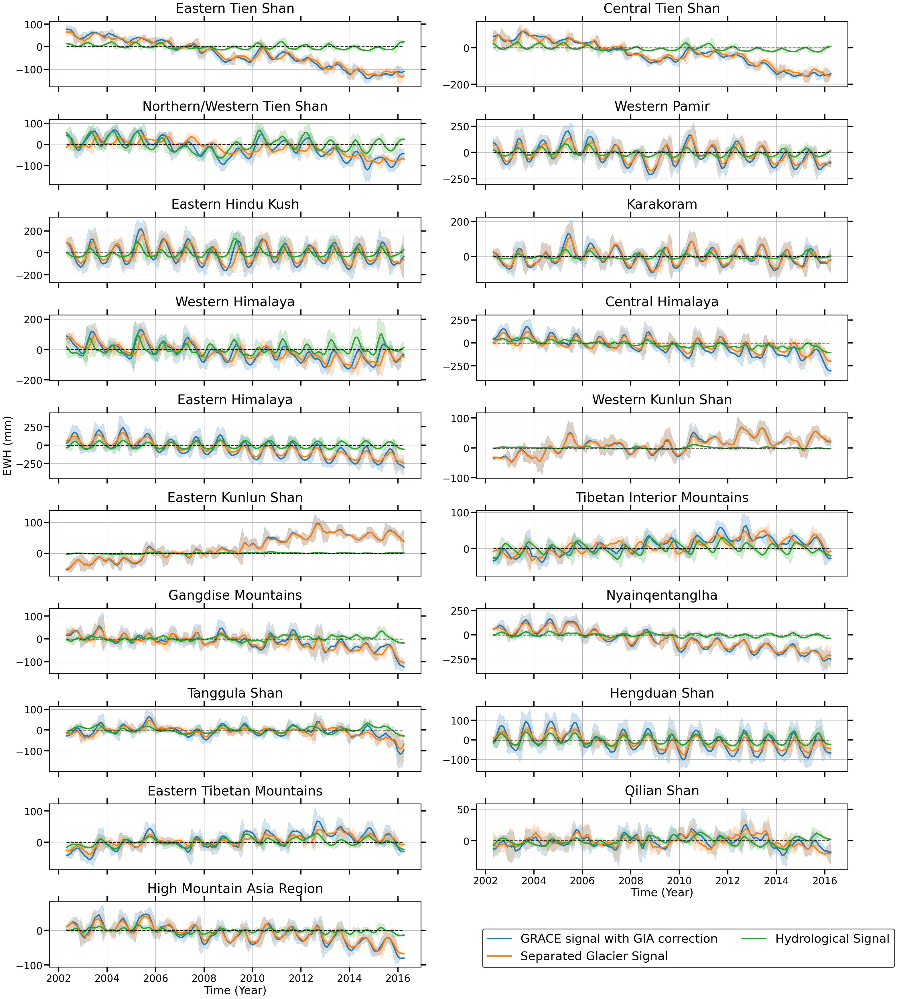

In [11]:
# Define datasets and colors
datasets = {
    "GRACE signal with GIA correction": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/New_EnsembleWeightedAverageMascon1.csv",
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv", #date column renamed as time to make consistency with others
    "Hydrological Signal": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/WGAP_HM/New_HMA_RegionalAvergaed_anomalies_wghTWS.csv" #New_HMA_RegionalAvergaed_anomalies_wghTWS.csv
}

dataset_colors = {
    "GRACE signal with GIA correction": "#1f77b4",       # Blue
    "Separated Glacier Signal": "#ff7f0e",   # Orange
    "Hydrological Signal": "#2ca02c"         # Green
}

# Load region metadata
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha', 'Gangdise Mountains', 'Hengduan Shan',
        'Tibetan Interior Mountains', 'Tanggula Shan', 'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan',
        'Eastern Tien Shan', 'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load and preprocess all datasets
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]  # Ensure consistent region order

# Setup figure
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

# Generate x-ticks
time_index = dfs[list(datasets.keys())[0]].index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

# Parameters for uncertainty envelope
rolling_window = 3  # For rolling std

for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    ax = axes[i]
    handles = []  # For legend

    for name, df in dfs.items():
        series = df[region]
        mean = series.rolling(rolling_window, center=True, min_periods=1).mean() #rolling meean
        std = series.rolling(rolling_window, center=True, min_periods=1).std() #rolling std we get

        # # Plot uncertainty envelope (no label, so not in legend) : mean ±  standard deviations
        # ax.fill_between(series.index, mean - std, mean + std, color=dataset_colors[name], alpha=0.2)

        # Use mean - 2*std and mean + 2*std for a 2 SD envelope: mean ±  2sigma
        ax.fill_between(series.index, mean - 2*std, mean + 2*std, color=dataset_colors[name], alpha=0.2)

        # # Plot mean line (add label only for the line, not for the envelope)
        line, = ax.plot(series.index, mean, color=dataset_colors[name], label=name, linewidth=3.5)
        handles.append(line)

    ax.set_title(region, fontsize=33, pad=22)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    ax.tick_params(axis='x', labelsize=25, direction='out', top=True, bottom=True, length=14, width=3)
    ax.tick_params(axis='y', labelsize=25, direction='out', left=True, right=True, length=14, width=3)
    ax.hlines(0, time_index.min(), time_index.max(), colors='k', linestyles='--', linewidth=2)

for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

axes[8].set_ylabel('EWH (mm)', fontsize=28)
axes[17].set_xlabel('Time (Year)', fontsize=28)
axes[18].set_xlabel('Time (Year)', fontsize=28)
axes[17].tick_params(labelbottom=True)
axes[17].xaxis.get_label().set_visible(True)

# Only add legend to one axis (e.g., axes[18])
legend = axes[18].legend(
    handles,
    # list(datasets.keys()),
    [h.get_label() for h in handles],
    loc='center left',
    bbox_to_anchor=(1.15, 0.29),
    ncol=2,
    fontsize=30,
    frameon=True
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)
axes[18].tick_params(labelbottom=True)

for j in range(len(df.columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)
plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_TimeSeries/GRACESignal_withGIA_corr_HYdrologicalSignalGlacierSignal_withAnomaliesWGH__timeseries_no_sharey_withEnvelope.png', dpi=300, bbox_inches='tight')
plt.show()

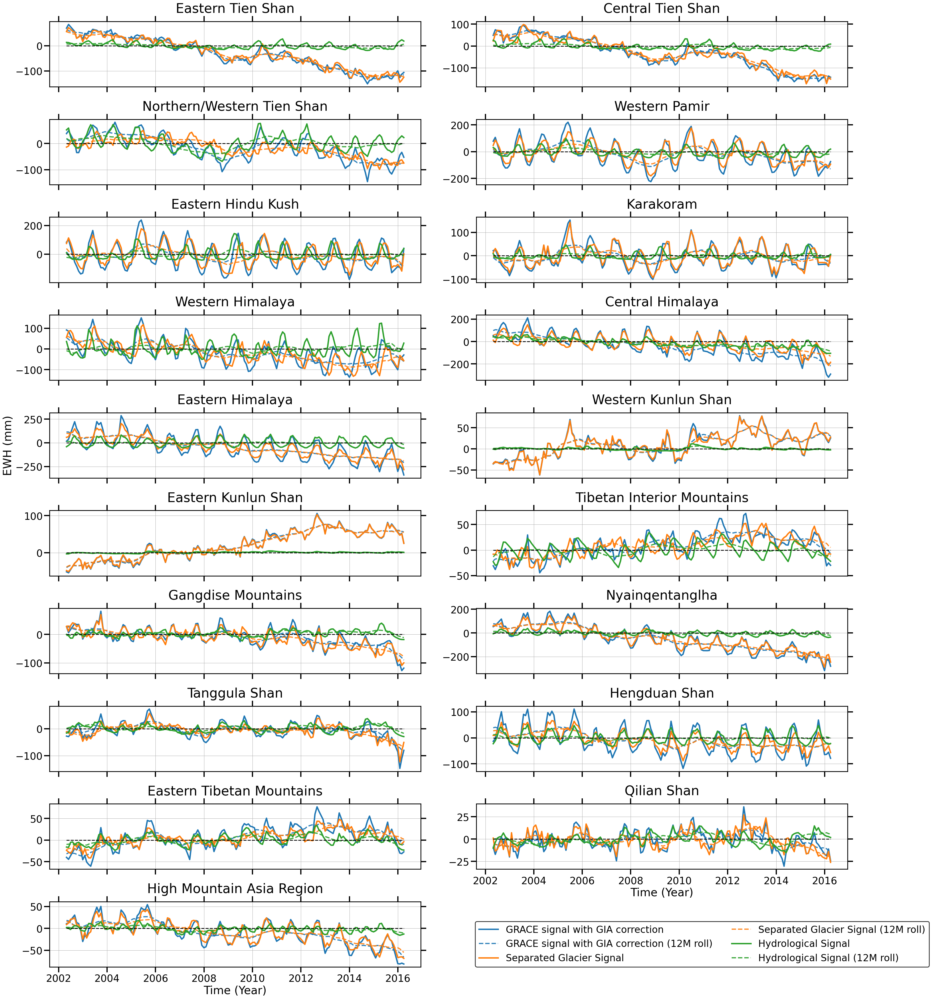

In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Define datasets and their corresponding colors
datasets = {
    "GRACE signal with GIA correction": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/New_EnsembleWeightedAverageMascon1.csv",
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv", #date column renamed as time to make consistency with others
    "Hydrological Signal": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/WGAP_HM/New_HMA_RegionalAvergaed_anomalies_wghTWS.csv" #New_HMA_RegionalAvergaed_anomalies_wghTWS.csv
}

dataset_colors = {
    "GRACE signal with GIA correction": "#1f77b4",       # Blue
    "Separated Glacier Signal": "#ff7f0e",   # Orange
    "Hydrological Signal": "#2ca02c"         # Green
}

# Load region metadata and define consistent order
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha', 
        'Gangdise Mountains', 'Hengduan Shan', 'Tibetan Interior Mountains', 'Tanggula Shan', 
        'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan', 'Eastern Tien Shan', 
        'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load and preprocess all datasets
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]  # Ensure region order matches metadata

#z_95 = 1.96  # z-score for 95% confidence interval

# Setup figure and axes
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

# Generate x-ticks
time_index = dfs[list(datasets.keys())[0]].index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

# For legend handle collection (legend will be added only in one axis)
handle_labels = {}

for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    ax = axes[i]
    
    for name, df in dfs.items():
        # Plot original monthly signal as a solid line
        raw_line, = ax.plot(
            df[region].index,
            df[region].values,
            color=dataset_colors[name],
            linewidth=3.5,
            label=name
        )
        # Plot the 12-month rolling mean as a dotted line in the same color
        roll_mean = df[region].rolling(12, center=True, min_periods=1).mean()
        # roll_std = df[region].rolling(12, center=True, min_periods=1).std()
        # roll_count = df[region].rolling(12, center=True, min_periods=1).count()

        # # Calculate standard error
        # se = roll_std / np.sqrt(roll_count)

        # # Calculate 95% confidence interval bounds
        # ci_lower = roll_mean - z_95 * se
        # ci_upper = roll_mean + z_95 * se

        roll_line, = ax.plot(
            roll_mean.index,
            roll_mean.values,
            color=dataset_colors[name],
            linewidth=3,
            linestyle='--',
            alpha=0.9,
            label=f"{name} (12M roll)"
        )

        # # Plot uncertainty envelope only for Glacier and Hydrological signals
        # if name in ["Separated Glacier Signal", "Hydrological Signal", "GRACE Signal"]:
        #     ax.fill_between(
        #         roll_mean.index,
        #         ci_lower,
        #         ci_upper,
        #         color=dataset_colors[name],
        #         alpha=0.25,
        #         label=None  # exclude from legend to avoid clutter
        #     )
        
        # Only collect handles for the first subplot for legend
        if i == 0:
            handle_labels[name] = raw_line
            handle_labels[f"{name} (12M roll)"] = roll_line

    ax.set_title(region, fontsize=33, pad=22)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    ax.tick_params(axis='x', labelsize=25, direction='out', top=True, bottom=True, length=14, width=3)
    ax.tick_params(axis='y', labelsize=25, direction='out', left=True, right=True, length=14, width=3)
    ax.hlines(0, time_index.min(), time_index.max(), colors='k', linestyles='--', linewidth=2)

# Set thick black border for each axis
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

# Set axis labels
axes[8].set_ylabel('EWH (mm)', fontsize=28)
axes[17].set_xlabel('Time (Year)', fontsize=28)
axes[18].set_xlabel('Time (Year)', fontsize=28)
axes[17].tick_params(labelbottom=True)
axes[17].xaxis.get_label().set_visible(True)

# Add legend to one axis only (e.g., axes[18])
legend = axes[18].legend(
    handle_labels.values(),
    handle_labels.keys(),
    loc='center left',
    bbox_to_anchor=(1.134, 0.35),
    ncol=2,
    fontsize=24,
    frameon=True
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)
axes[18].tick_params(labelbottom=True)

# Remove unused subplots
for j in range(len(region_metadata_sorted), len(axes)):
    fig.delaxes(axes[j])

# Final adjustments
plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)
plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_TimeSeries/GRACESignal_withGIA_corr_HYdrologicalSignalGlacierSignal_withAnomaliesWGH__timeseries_no_sharey_withMovingAverage.png', dpi=300, bbox_inches='tight')
plt.show()

![Perform linear trend / multi-seasonal decomposition](linear_trend.png)

a: constant
b: linear trend
c,d: annual term
e,f: semi_annual terms
r: residuals

## Annual Amplitude

![annual_amplitude.png](annual_amplitude.png)

![Amplitude annd phase](amplitude_phase.png)

![Phase and Amplitude](phase_amplitude.png)

-----------
---------
## Computaion of the Annual Amplitude, Semi-annual Amplitude and Phase

In [104]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit

# Load your data
df = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', parse_dates=['time'])

t_ns = df['time'].view('int64').values
YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9

def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semian = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semian

results = {}
uncertainties = {}

for region in df.columns.drop('time'):
    y = df[region].values
    mask = np.isfinite(y)
    if mask.sum() < 6:
        continue
    try:
        params, pcov = curve_fit(
            decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0]
        )
        results[region] = params

        if pcov is not None:
            uncertainties[region] = 2 * np.sqrt(np.abs(np.diag(pcov)))  # 2-sigma uncertainties for all params
        else:
            uncertainties[region] = np.full(6, np.nan)
    except RuntimeError:
        results[region] = np.full(6, np.nan)
        uncertainties[region] = np.full(6, np.nan)

summary = []

for region, params in results.items():
    if params is None or np.any(np.isnan(params)):
        continue
    a, b, c, d, e, f = params
    unc = uncertainties[region]
    unc_c, unc_d, unc_e, unc_f = unc[2], unc[3], unc[4], unc[5]

    # Annual amplitude and uncertainty (error propagation)
    amp_annual = np.sqrt(c**2 + d**2)
    amp_annual_unc = (1 / amp_annual) * np.sqrt((c * unc_c)**2 + (d * unc_d)**2) if amp_annual != 0 else np.nan

    # Annual phase and uncertainty (propagation of uncertainty)
    phase_annual_rad = np.arctan2(-d, c)
    denom_annual = c**2 + d**2
    phase_annual_unc_rad = np.sqrt(
        (d / denom_annual)**2 * unc_c**2 +
        (c / denom_annual)**2 * unc_d**2
    ) if denom_annual != 0 else np.nan
    phase_annual_deg = np.degrees(phase_annual_rad)
    phase_annual_unc_deg = np.degrees(phase_annual_unc_rad)

    # Semi-annual amplitude and uncertainty
    amp_semi = np.sqrt(e**2 + f**2)
    amp_semi_unc = (1 / amp_semi) * np.sqrt((e * unc_e)**2 + (f * unc_f)**2) if amp_semi != 0 else np.nan

    # Semi-annual phase and uncertainty
    phase_semi_rad = np.arctan2(-f, e)
    denom_semi = e**2 + f**2
    phase_semi_unc_rad = np.sqrt(
        (f / denom_semi)**2 * unc_e**2 +
        (e / denom_semi)**2 * unc_f**2
    ) if denom_semi != 0 else np.nan
    phase_semi_deg = np.degrees(phase_semi_rad)
    phase_semi_unc_deg = np.degrees(phase_semi_unc_rad)

    summary.append({
        'Region': region,
        'Annual Amplitude (mm w.e.)': amp_annual,
        'Annual Amplitude 2-sigma': amp_annual_unc,
        'Annual Phase (deg)': phase_annual_deg,
        'Annual Phase 2-sigma (deg)': phase_annual_unc_deg,
        'Semi-annual Amplitude (mm w.e.)': amp_semi,
        'Semi-annual Amplitude 2-sigma': amp_semi_unc,
        'Semi-annual Phase (deg)': phase_semi_deg,
        'Semi-annual Phase 2-sigma (deg)': phase_semi_unc_deg,
        'Linear Trend (mm w.e./yr)': b,
        'Linear Trend 2-sigma': unc[1]
    })

summary_df = pd.DataFrame(summary)
print(summary_df)

                        Region  Annual Amplitude (mm w.e.)  \
0           Dzhungarsky Alatau                   40.003849   
1            Eastern Tien Shan                   13.330736   
2            Central Tien Shan                   16.855377   
3   Northern/Western Tien Shan                   14.892603   
4                   Pamir Alay                   49.205964   
5                Western Pamir                   80.969502   
6                Eastern Pamir                   27.187195   
7           Eastern Hindu Kush                   89.505357   
8                    Karakoram                   49.411734   
9             Western Himalaya                   37.047905   
10            Central Himalaya                   68.270218   
11            Eastern Himalaya                   72.689396   
12         Western Kunlun Shan                   16.228627   
13         Eastern Kunlun Shan                   11.028951   
14                  Altun Shan                    2.741995   
15  Tibe

In [105]:
summary_df

,Region,Annual Amplitude (mm w.e.),Annual Amplitude 2-sigma,Annual Phase (deg),Annual Phase 2-sigma (deg),Semi-annual Amplitude (mm w.e.),Semi-annual Amplitude 2-sigma,Semi-annual Phase (deg),Semi-annual Phase 2-sigma (deg),Linear Trend (mm w.e./yr),Linear Trend 2-sigma
0,Dzhungarsky Alatau,40.003849,3.909569,138.001525,5.601740,13.322855,3.921280,-80.910714,16.750507,-6.495382,0.684966
1,Eastern Tien Shan,13.330736,2.917988,88.395103,12.493903,2.848008,2.919336,-107.043959,58.386928,-13.351841,0.510166
2,Central Tien Shan,16.855377,4.961711,115.736041,16.826115,7.431839,4.970526,-88.353001,38.050006,-14.566722,0.868100
3,Northern/Western Tien Shan,14.892603,3.961537,94.158934,15.183668,7.680663,3.965018,-80.163152,29.381226,-6.259432,0.692626
4,Pamir Alay,49.205964,7.924468,40.177225,9.233207,6.980815,7.950363,-86.609334,64.795689,-6.255239,1.388552
5,Western Pamir,80.969502,9.290270,56.194542,6.564453,20.154997,9.308150,-102.282789,26.290755,-5.309424,1.626172
6,Eastern Pamir,27.187195,6.029135,54.777207,12.689918,9.740446,6.034535,-116.811023,35.347726,-0.898105,1.055435
7,Eastern Hindu Kush,89.505357,7.420101,67.272749,4.737197,19.200116,7.420599,-118.100224,22.056927,-2.982284,1.298025
8,Karakoram,49.411734,5.678067,71.787408,6.563874,10.509407,5.679793,-113.618514,30.816723,-0.217436,0.993090
9,Western Himalaya,37.047905,5.369164,101.515400,8.274490,12.725850,5.371840,-108.603995,24.049540,-8.774482,0.938856


In [106]:
print(summary_df.columns)

Index(['Region', 'Annual Amplitude (mm w.e.)', 'Annual Amplitude 2-sigma',
       'Annual Phase (deg)', 'Annual Phase 2-sigma (deg)',
       'Semi-annual Amplitude (mm w.e.)', 'Semi-annual Amplitude 2-sigma',
       'Semi-annual Phase (deg)', 'Semi-annual Phase 2-sigma (deg)',
       'Linear Trend (mm w.e./yr)', 'Linear Trend 2-sigma'],
      dtype='object')


In [107]:
summary_df['Annual Amplitude ± 2σ (mm w.e.)'] = summary_df.apply(
    lambda row: f"{row['Annual Amplitude (mm w.e.)']:.3f} ± {row['Annual Amplitude 2-sigma']:.3f}",
    axis=1
)

summary_df['Semi-annual Amplitude ± 2σ (mm w.e.)'] = summary_df.apply(
    lambda row: f"{row['Semi-annual Amplitude (mm w.e.)']:.3f} ± {row['Semi-annual Amplitude 2-sigma']:.3f}",
    axis=1
)

summary_df['Annual Phase ± 2σ (deg)'] = summary_df.apply(
    lambda row: f"{row['Annual Phase (deg)']:.3f} ± {row['Annual Phase 2-sigma (deg)']:.3f}",
    axis=1
)

summary_df['Semi-annual Phase ± 2σ (deg)'] = summary_df.apply(
    lambda row: f"{row['Semi-annual Phase (deg)']:.3f} ± {row['Semi-annual Phase 2-sigma (deg)']:.3f}",
    axis=1
)

summary_df['Linear Trend ± 2σ (mm w.e./yr)'] = summary_df.apply(
    lambda row: f"{row['Linear Trend (mm w.e./yr)']:.3f} ± {row['Linear Trend 2-sigma']:.3f}",
    axis=1
)

# Optionally, drop original separate columns if no longer needed
cols_to_drop = [
    'Annual Amplitude (mm w.e.)', 'Annual Amplitude 2-sigma',
    'Semi-annual Amplitude (mm w.e.)', 'Semi-annual Amplitude 2-sigma',
    'Annual Phase (deg)', 'Annual Phase 2-sigma (deg)',
    'Semi-annual Phase (deg)', 'Semi-annual Phase 2-sigma (deg)',
    'Linear Trend (mm w.e./yr)', 'Linear Trend 2-sigma'
]
summary_df.drop(columns=cols_to_drop, inplace=True)

summary_df[['Region',
                  'Annual Amplitude ± 2σ (mm w.e.)',
                  'Annual Phase ± 2σ (deg)',
                  'Semi-annual Amplitude ± 2σ (mm w.e.)',
                  'Semi-annual Phase ± 2σ (deg)',
                  'Linear Trend ± 2σ (mm w.e./yr)'
                 ]]

,Region,Annual Amplitude ± 2σ (mm w.e.),Annual Phase ± 2σ (deg),Semi-annual Amplitude ± 2σ (mm w.e.),Semi-annual Phase ± 2σ (deg),Linear Trend ± 2σ (mm w.e./yr)
0,Dzhungarsky Alatau,40.004 ± 3.910,138.002 ± 5.602,13.323 ± 3.921,-80.911 ± 16.751,-6.495 ± 0.685
1,Eastern Tien Shan,13.331 ± 2.918,88.395 ± 12.494,2.848 ± 2.919,-107.044 ± 58.387,-13.352 ± 0.510
2,Central Tien Shan,16.855 ± 4.962,115.736 ± 16.826,7.432 ± 4.971,-88.353 ± 38.050,-14.567 ± 0.868
3,Northern/Western Tien Shan,14.893 ± 3.962,94.159 ± 15.184,7.681 ± 3.965,-80.163 ± 29.381,-6.259 ± 0.693
4,Pamir Alay,49.206 ± 7.924,40.177 ± 9.233,6.981 ± 7.950,-86.609 ± 64.796,-6.255 ± 1.389
5,Western Pamir,80.970 ± 9.290,56.195 ± 6.564,20.155 ± 9.308,-102.283 ± 26.291,-5.309 ± 1.626
6,Eastern Pamir,27.187 ± 6.029,54.777 ± 12.690,9.740 ± 6.035,-116.811 ± 35.348,-0.898 ± 1.055
7,Eastern Hindu Kush,89.505 ± 7.420,67.273 ± 4.737,19.200 ± 7.421,-118.100 ± 22.057,-2.982 ± 1.298
8,Karakoram,49.412 ± 5.678,71.787 ± 6.564,10.509 ± 5.680,-113.619 ± 30.817,-0.217 ± 0.993
9,Western Himalaya,37.048 ± 5.369,101.515 ± 8.274,12.726 ± 5.372,-108.604 ± 24.050,-8.774 ± 0.939


------
------

In [13]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit

# Load your data
df = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', parse_dates=['time'])


# Time in nanoseconds (all regions share the same time index)
t_ns = df['time'].view('int64').values

YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9

def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semian = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semian

results = {}

# Loop over each subregion column (skip 'time')
for region in df.columns.drop('time'):
    y = df[region].values
    mask = np.isfinite(y)  # Exclude NaNs if present
    if mask.sum() < 6:
        continue  # Not enough data to fit
    try:
        params, _ = curve_fit(decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0])
        results[region] = params  # params = [a, b, c, d, e, f]
    except RuntimeError:
        results[region] = [np.nan] * 6  # Fit failed

# Example: Get the linear trend for each region
trends = {region: params[1] for region, params in results.items() if params is not None}

# Put results in a DataFrame for summary
fit_df = pd.DataFrame(results, index=['a', 'b', 'c', 'd', 'e', 'f']).T
fit_df.rename(columns={'b': 'linear_trend (mm w.e/yr)'}, inplace=True)

print(fit_df[['linear_trend (mm w.e/yr)']])

                            linear_trend (mm w.e/yr)
Dzhungarsky Alatau                         -6.495382
Eastern Tien Shan                         -13.351841
Central Tien Shan                         -14.566722
Northern/Western Tien Shan                 -6.259432
Pamir Alay                                 -6.255239
Western Pamir                              -5.309424
Eastern Pamir                              -0.898105
Eastern Hindu Kush                         -2.982284
Karakoram                                  -0.217436
Western Himalaya                           -8.774482
Central Himalaya                          -10.346750
Eastern Himalaya                          -20.204475
Western Kunlun Shan                         4.636169
Eastern Kunlun Shan                         8.122213
Altun Shan                                  3.077065
Tibetan Interior Mountains                  3.230403
Gangdise Mountains                         -5.438623
Nyainqentanglha                           -20.

In [14]:
fit_df

,a,linear_trend (mm w.e/yr),c,d,e,f
Dzhungarsky Alatau,240.621118,-6.495382,-29.729366,-26.767009,2.104657,13.155564
Eastern Tien Shan,493.778366,-13.351841,0.373355,-13.325507,-0.834766,2.722924
Central Tien Shan,540.466052,-14.566722,-7.319040,-15.183392,0.213603,7.428769
Northern/Western Tien Shan,229.354944,-6.259432,-1.080062,-14.853386,1.312189,7.567744
Pamir Alay,228.970181,-6.255239,37.595942,-31.745426,0.412872,6.968595
Western Pamir,194.263008,-5.309424,45.049389,-67.280107,-4.287711,19.693639
Eastern Pamir,31.977639,-0.898105,15.680415,-22.209642,-4.393421,8.693339
Eastern Hindu Kush,108.391986,-2.982284,34.579927,-82.555664,-9.043549,16.936903
Karakoram,5.214798,-0.217436,15.443326,-46.936373,-4.210543,9.629069
Western Himalaya,324.456194,-8.774482,-7.395922,-36.302170,-4.059869,12.060875


In [16]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit

# Load your data
df = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', parse_dates=['time'])

t_ns = df['time'].view('int64').values
YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9

def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semian = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semian

results = {}
uncertainties = {}

for region in df.columns.drop('time'):
    y = df[region].values
    mask = np.isfinite(y)
    if mask.sum() < 6:
        continue
    try:
        params, pcov = curve_fit(
            decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0]
        )
        results[region] = params
        # Standard error for parameter 'b' (linear trend) is sqrt(pcov[1, 1])
        if pcov is not None:
            sigma_b = np.sqrt(np.abs(pcov[1, 1]))
            uncertainties[region] = 2*sigma_b  # 2-sigma uncertainty
        else:
            uncertainties[region] = np.nan
    except RuntimeError:
        results[region] = [np.nan] * 6
        uncertainties[region] = np.nan

# Compile into a DataFrame for easy viewing
fit_df = pd.DataFrame(results, index=['a', 'b', 'c', 'd', 'e', 'f']).T
fit_df['linear_trend_2sigma'] = pd.Series(uncertainties)
fit_df.rename(columns={'b': 'linear_trend (mm w.e/yr)'}, inplace=True)

print(fit_df[['linear_trend (mm w.e/yr)', 'linear_trend_2sigma']])

                            linear_trend (mm w.e/yr)  linear_trend_2sigma
Dzhungarsky Alatau                         -6.495382             0.684966
Eastern Tien Shan                         -13.351841             0.510166
Central Tien Shan                         -14.566722             0.868100
Northern/Western Tien Shan                 -6.259432             0.692626
Pamir Alay                                 -6.255239             1.388552
Western Pamir                              -5.309424             1.626172
Eastern Pamir                              -0.898105             1.055435
Eastern Hindu Kush                         -2.982284             1.298025
Karakoram                                  -0.217436             0.993090
Western Himalaya                           -8.774482             0.938856
Central Himalaya                          -10.346750             0.992608
Eastern Himalaya                          -20.204475             0.964081
Western Kunlun Shan                   

In [17]:
# Export the selected columns to CSV
fit_df[['linear_trend (mm w.e/yr)', 'linear_trend_2sigma']].to_csv('With_VCEMascon_with_GIA_corr_glacier_trends.csv')

In [18]:
MasconGlacierTrend = pd.read_csv('With_VCEMascon_with_GIA_corr_glacier_trends.csv')
MasconGlacierTrend

,Unnamed: 0,linear_trend (mm w.e/yr),linear_trend_2sigma
0,Dzhungarsky Alatau,-6.495382,0.684966
1,Eastern Tien Shan,-13.351841,0.510166
2,Central Tien Shan,-14.566722,0.868100
3,Northern/Western Tien Shan,-6.259432,0.692626
4,Pamir Alay,-6.255239,1.388552
5,Western Pamir,-5.309424,1.626172
6,Eastern Pamir,-0.898105,1.055435
7,Eastern Hindu Kush,-2.982284,1.298025
8,Karakoram,-0.217436,0.993090
9,Western Himalaya,-8.774482,0.938856


In [19]:
# Suppose your DataFrame is named df
MasconGlacierTrend.rename(columns={MasconGlacierTrend.columns[0]: 'Primary_ID'}, inplace=True)
MasconGlacierTrend

,Primary_ID,linear_trend (mm w.e/yr),linear_trend_2sigma
0,Dzhungarsky Alatau,-6.495382,0.684966
1,Eastern Tien Shan,-13.351841,0.510166
2,Central Tien Shan,-14.566722,0.868100
3,Northern/Western Tien Shan,-6.259432,0.692626
4,Pamir Alay,-6.255239,1.388552
5,Western Pamir,-5.309424,1.626172
6,Eastern Pamir,-0.898105,1.055435
7,Eastern Hindu Kush,-2.982284,1.298025
8,Karakoram,-0.217436,0.993090
9,Western Himalaya,-8.774482,0.938856


-------

In [21]:
# 1. Load and prepare the shapefile
gdf = gpd.read_file(r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\Updated_TotalHMA_boundary1_22.shp')
gdf_4326 = gdf.to_crs('EPSG:4326')  # Reproject to match dataset CRS

dropped_gdf_4326 = gdf_4326.drop(['Primary__1', 'Glacier_Ar'], axis=1)
dropped_gdf_4326

,Primary_ID,Area,Shape_Area,Region_No,geometry
0,Eastern Hindu Kush,111147.061871,1.111471e+11,8,"POLYGON ((73.45158 36.98397, 73.44585 36.96572..."
1,Western Himalaya,211514.200081,2.115142e+11,10,"POLYGON ((75.78739 35.3156, 75.7874 35.3156, 7..."
2,Eastern Himalaya,166943.561268,1.669436e+11,12,"POLYGON ((95.22303 29.82187, 95.21352 29.80717..."
3,Central Himalaya,270268.094462,2.702681e+11,11,"POLYGON ((80.93559 30.70763, 80.98095 30.6962,..."
4,Karakoram,92830.485352,9.283049e+10,9,"POLYGON ((75.87358 37.3118, 75.89056 37.31113,..."
5,Western Pamir,124880.500694,1.248805e+11,6,"POLYGON ((73.91513 39.69697, 73.92109 39.68454..."
6,Pamir Alay,83444.425531,8.344443e+10,5,"POLYGON ((73.66215 40.58146, 73.727 40.56312, ..."
7,Northern/Western Tien Shan,205724.916795,2.057249e+11,4,"POLYGON ((83.06636 43.4915, 82.95135 43.44983,..."
8,Dzhungarsky Alatau,39543.166059,3.954317e+10,1,"POLYGON ((81.62713 44.61643, 81.28999 44.60156..."
9,Western Kunlun Shan,132813.049169,1.328130e+11,13,"POLYGON ((77.76951 37.37377, 78.24539 37.24774..."


In [22]:
gdf1 = gpd.read_file(r"D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\Updated_SingleHMAboundarythatincludes1to22.shp")
gdf1_4326 = gdf1.to_crs('EPSG:4326')  # Reproject to match dataset CRS

dropped_gdf1_4326 = gdf1_4326.drop(['Primary__1', 'Glacier_Ar'], axis=1)  #already done , so comes weror wehn done
dropped_gdf1_4326

,Primary_ID,Area,Shape_Area,Region_No,geometry
0,High Mountain Asia Region,3.993978e+06,3.993978e+12,23,"POLYGON ((92.26394 39.3763, 92.24847 39.32136,..."


In [23]:
gdf_concat = pd.concat([dropped_gdf_4326, dropped_gdf1_4326 ], axis=0, ignore_index=True)
gdf_concat

,Primary_ID,Area,Shape_Area,Region_No,geometry
0,Eastern Hindu Kush,1.111471e+05,1.111471e+11,8,"POLYGON ((73.45158 36.98397, 73.44585 36.96572..."
1,Western Himalaya,2.115142e+05,2.115142e+11,10,"POLYGON ((75.78739 35.3156, 75.7874 35.3156, 7..."
2,Eastern Himalaya,1.669436e+05,1.669436e+11,12,"POLYGON ((95.22303 29.82187, 95.21352 29.80717..."
3,Central Himalaya,2.702681e+05,2.702681e+11,11,"POLYGON ((80.93559 30.70763, 80.98095 30.6962,..."
4,Karakoram,9.283049e+04,9.283049e+10,9,"POLYGON ((75.87358 37.3118, 75.89056 37.31113,..."
5,Western Pamir,1.248805e+05,1.248805e+11,6,"POLYGON ((73.91513 39.69697, 73.92109 39.68454..."
6,Pamir Alay,8.344443e+04,8.344443e+10,5,"POLYGON ((73.66215 40.58146, 73.727 40.56312, ..."
7,Northern/Western Tien Shan,2.057249e+05,2.057249e+11,4,"POLYGON ((83.06636 43.4915, 82.95135 43.44983,..."
8,Dzhungarsky Alatau,3.954317e+04,3.954317e+10,1,"POLYGON ((81.62713 44.61643, 81.28999 44.60156..."
9,Western Kunlun Shan,1.328130e+05,1.328130e+11,13,"POLYGON ((77.76951 37.37377, 78.24539 37.24774..."


## Changing the Linear Trend into Gt/yr

In [24]:
import pandas as pd


# Merge on 'Region' (can use join or merge, see pandas docs[1][2])
merged = pd.merge(MasconGlacierTrend, gdf_concat, on='Primary_ID', how='inner')
merged

,Primary_ID,linear_trend (mm w.e/yr),linear_trend_2sigma,Area,Shape_Area,Region_No,geometry
0,Dzhungarsky Alatau,-6.495382,0.684966,3.954317e+04,3.954317e+10,1,"POLYGON ((81.62713 44.61643, 81.28999 44.60156..."
1,Eastern Tien Shan,-13.351841,0.510166,1.442085e+05,1.442085e+11,2,"POLYGON ((86.09337 42.2087, 85.99439 42.221, 8..."
2,Central Tien Shan,-14.566722,0.868100,1.119471e+05,1.119471e+11,3,"POLYGON ((78.58024 42.07865, 78.58266 42.07968..."
3,Northern/Western Tien Shan,-6.259432,0.692626,2.057249e+05,2.057249e+11,4,"POLYGON ((83.06636 43.4915, 82.95135 43.44983,..."
4,Pamir Alay,-6.255239,1.388552,8.344443e+04,8.344443e+10,5,"POLYGON ((73.66215 40.58146, 73.727 40.56312, ..."
5,Western Pamir,-5.309424,1.626172,1.248805e+05,1.248805e+11,6,"POLYGON ((73.91513 39.69697, 73.92109 39.68454..."
6,Eastern Pamir,-0.898105,1.055435,4.397554e+04,4.397554e+10,7,"POLYGON ((74.47132 37.09355, 74.44653 37.11363..."
7,Eastern Hindu Kush,-2.982284,1.298025,1.111471e+05,1.111471e+11,8,"POLYGON ((73.45158 36.98397, 73.44585 36.96572..."
8,Karakoram,-0.217436,0.993090,9.283049e+04,9.283049e+10,9,"POLYGON ((75.87358 37.3118, 75.89056 37.31113,..."
9,Western Himalaya,-8.774482,0.938856,2.115142e+05,2.115142e+11,10,"POLYGON ((75.78739 35.3156, 75.7874 35.3156, 7..."


## Changing Linear Trend (mm we/yr) into Gt/yr)

In [25]:
#calculated above
merged

,Primary_ID,linear_trend (mm w.e/yr),linear_trend_2sigma,Area,Shape_Area,Region_No,geometry
0,Dzhungarsky Alatau,-6.495382,0.684966,3.954317e+04,3.954317e+10,1,"POLYGON ((81.62713 44.61643, 81.28999 44.60156..."
1,Eastern Tien Shan,-13.351841,0.510166,1.442085e+05,1.442085e+11,2,"POLYGON ((86.09337 42.2087, 85.99439 42.221, 8..."
2,Central Tien Shan,-14.566722,0.868100,1.119471e+05,1.119471e+11,3,"POLYGON ((78.58024 42.07865, 78.58266 42.07968..."
3,Northern/Western Tien Shan,-6.259432,0.692626,2.057249e+05,2.057249e+11,4,"POLYGON ((83.06636 43.4915, 82.95135 43.44983,..."
4,Pamir Alay,-6.255239,1.388552,8.344443e+04,8.344443e+10,5,"POLYGON ((73.66215 40.58146, 73.727 40.56312, ..."
5,Western Pamir,-5.309424,1.626172,1.248805e+05,1.248805e+11,6,"POLYGON ((73.91513 39.69697, 73.92109 39.68454..."
6,Eastern Pamir,-0.898105,1.055435,4.397554e+04,4.397554e+10,7,"POLYGON ((74.47132 37.09355, 74.44653 37.11363..."
7,Eastern Hindu Kush,-2.982284,1.298025,1.111471e+05,1.111471e+11,8,"POLYGON ((73.45158 36.98397, 73.44585 36.96572..."
8,Karakoram,-0.217436,0.993090,9.283049e+04,9.283049e+10,9,"POLYGON ((75.87358 37.3118, 75.89056 37.31113,..."
9,Western Himalaya,-8.774482,0.938856,2.115142e+05,2.115142e+11,10,"POLYGON ((75.78739 35.3156, 75.7874 35.3156, 7..."


In [26]:
import pandas as pd

# # Assuming 'masconglaciertrend' has the region as the index or as a column, e.g., 'Region'
# # and columns: 'linear_trend (mm w.e/yr)'
# # Assuming 'gdf_concat' has the region as a column (e.g., 'Primary_ID') and 'Shape_Area' (in m^2)

# # If 'masconglaciertrend' region info is in the index (adjust if it's a column)
# masconglaciertrend = masconglaciertrend.reset_index().rename(columns={'index': 'Region'})
# gdf_concat = gdf_concat.rename(columns={'Primary_ID': 'Region'})

# # Merge on 'Region' (can use join or merge, see pandas docs[1][2])
# merged = pd.merge(masconglaciertrend, gdf_concat, on='Region', how='inner')

# # Compute linear trend in Gt/yr using your formula
# # Gt = linear trend (mm w.e./yr) * 10^-3 (to meters) * 1000 (to kg/m^2) * (area in m^2 / 10^12)
# # This simplifies to: linear trend (mm w.e./yr) * (Shape_Area / 10^9) * 10^-3

merged['lineartrend_In_GT (Gt/yr)'] = (
    merged['linear_trend (mm w.e/yr)'] * 10**-3 * 1000
    * merged['Shape_Area'] / 1e12
)
merged['linear_trend_2sigma (Gt/yr)'] = (
    merged['linear_trend_2sigma'] * 10**-3 * 1000
    * merged['Shape_Area'] / 1e12
)


# # View result
# print(merged[['Region', 'linear_trend (mm w.e/yr)', 'Shape_Area', 'lineartrend_In_GT']])

# # Optional: Export to CSV
# merged[['Region', 'linear_trend (mm w.e/yr)', 'Shape_Area', 'lineartrend_In_GT']].to_csv('glacier_subregion_trends_Gt_per_year.csv', index=False)

merged

,Primary_ID,linear_trend (mm w.e/yr),linear_trend_2sigma,Area,Shape_Area,Region_No,geometry,lineartrend_In_GT (Gt/yr),linear_trend_2sigma (Gt/yr)
0,Dzhungarsky Alatau,-6.495382,0.684966,3.954317e+04,3.954317e+10,1,"POLYGON ((81.62713 44.61643, 81.28999 44.60156...",-0.256848,0.027086
1,Eastern Tien Shan,-13.351841,0.510166,1.442085e+05,1.442085e+11,2,"POLYGON ((86.09337 42.2087, 85.99439 42.221, 8...",-1.925449,0.073570
2,Central Tien Shan,-14.566722,0.868100,1.119471e+05,1.119471e+11,3,"POLYGON ((78.58024 42.07865, 78.58266 42.07968...",-1.630703,0.097181
3,Northern/Western Tien Shan,-6.259432,0.692626,2.057249e+05,2.057249e+11,4,"POLYGON ((83.06636 43.4915, 82.95135 43.44983,...",-1.287721,0.142491
4,Pamir Alay,-6.255239,1.388552,8.344443e+04,8.344443e+10,5,"POLYGON ((73.66215 40.58146, 73.727 40.56312, ...",-0.521965,0.115867
5,Western Pamir,-5.309424,1.626172,1.248805e+05,1.248805e+11,6,"POLYGON ((73.91513 39.69697, 73.92109 39.68454...",-0.663043,0.203077
6,Eastern Pamir,-0.898105,1.055435,4.397554e+04,4.397554e+10,7,"POLYGON ((74.47132 37.09355, 74.44653 37.11363...",-0.039495,0.046413
7,Eastern Hindu Kush,-2.982284,1.298025,1.111471e+05,1.111471e+11,8,"POLYGON ((73.45158 36.98397, 73.44585 36.96572...",-0.331472,0.144272
8,Karakoram,-0.217436,0.993090,9.283049e+04,9.283049e+10,9,"POLYGON ((75.87358 37.3118, 75.89056 37.31113,...",-0.020185,0.092189
9,Western Himalaya,-8.774482,0.938856,2.115142e+05,2.115142e+11,10,"POLYGON ((75.78739 35.3156, 75.7874 35.3156, 7...",-1.855928,0.198581


In [36]:
extracted_df = merged[['Primary_ID', 'Region_No', 'Shape_Area', 'lineartrend_In_GT (Gt/yr)', 'linear_trend_2sigma (Gt/yr)']]
extracted_df

,Primary_ID,Region_No,Shape_Area,lineartrend_In_GT (Gt/yr),linear_trend_2sigma (Gt/yr)
0,Dzhungarsky Alatau,1,3.954317e+10,-0.256848,0.027086
1,Eastern Tien Shan,2,1.442085e+11,-1.925449,0.073570
2,Central Tien Shan,3,1.119471e+11,-1.630703,0.097181
3,Northern/Western Tien Shan,4,2.057249e+11,-1.287721,0.142491
4,Pamir Alay,5,8.344443e+10,-0.521965,0.115867
5,Western Pamir,6,1.248805e+11,-0.663043,0.203077
6,Eastern Pamir,7,4.397554e+10,-0.039495,0.046413
7,Eastern Hindu Kush,8,1.111471e+11,-0.331472,0.144272
8,Karakoram,9,9.283049e+10,-0.020185,0.092189
9,Western Himalaya,10,2.115142e+11,-1.855928,0.198581


In [44]:
extracted_df['trend ± uncertainty (Gt/yr)'] = extracted_df.apply(
    lambda row: f"{row['lineartrend_In_GT (Gt/yr)']:.3f} ± {row['linear_trend_2sigma (Gt/yr)']:.3f}",
    axis=1
)

# extracted_df[['trend ± uncertainty (Gt/yr)']]
extracted_df

,Primary_ID,Region_No,Shape_Area,lineartrend_In_GT (Gt/yr),linear_trend_2sigma (Gt/yr),trend ± uncertainty (Gt/yr)
0,Dzhungarsky Alatau,1,3.954317e+10,-0.256848,0.027086,-0.257 ± 0.027
1,Eastern Tien Shan,2,1.442085e+11,-1.925449,0.073570,-1.925 ± 0.074
2,Central Tien Shan,3,1.119471e+11,-1.630703,0.097181,-1.631 ± 0.097
3,Northern/Western Tien Shan,4,2.057249e+11,-1.287721,0.142491,-1.288 ± 0.142
4,Pamir Alay,5,8.344443e+10,-0.521965,0.115867,-0.522 ± 0.116
5,Western Pamir,6,1.248805e+11,-0.663043,0.203077,-0.663 ± 0.203
6,Eastern Pamir,7,4.397554e+10,-0.039495,0.046413,-0.039 ± 0.046
7,Eastern Hindu Kush,8,1.111471e+11,-0.331472,0.144272,-0.331 ± 0.144
8,Karakoram,9,9.283049e+10,-0.020185,0.092189,-0.020 ± 0.092
9,Western Himalaya,10,2.115142e+11,-1.855928,0.198581,-1.856 ± 0.199


In [45]:
extracted_df1 = extracted_df[['Primary_ID', 'Region_No', 'Shape_Area', 'trend ± uncertainty (Gt/yr)']]
extracted_df1

,Primary_ID,Region_No,Shape_Area,trend ± uncertainty (Gt/yr)
0,Dzhungarsky Alatau,1,3.954317e+10,-0.257 ± 0.027
1,Eastern Tien Shan,2,1.442085e+11,-1.925 ± 0.074
2,Central Tien Shan,3,1.119471e+11,-1.631 ± 0.097
3,Northern/Western Tien Shan,4,2.057249e+11,-1.288 ± 0.142
4,Pamir Alay,5,8.344443e+10,-0.522 ± 0.116
5,Western Pamir,6,1.248805e+11,-0.663 ± 0.203
6,Eastern Pamir,7,4.397554e+10,-0.039 ± 0.046
7,Eastern Hindu Kush,8,1.111471e+11,-0.331 ± 0.144
8,Karakoram,9,9.283049e+10,-0.020 ± 0.092
9,Western Himalaya,10,2.115142e+11,-1.856 ± 0.199


In [46]:
extracted_df1.to_csv('VCEMascon_with_GIA_corr_glacier_subregion_trends_Gt_per_year_withUncertainty.csv', index=False)

In [47]:
pd.read_csv('VCEMascon_with_GIA_corr_glacier_subregion_trends_Gt_per_year_withUncertainty.csv')

,Primary_ID,Region_No,Shape_Area,trend ± uncertainty (Gt/yr)
0,Dzhungarsky Alatau,1,3.954317e+10,-0.257 ± 0.027
1,Eastern Tien Shan,2,1.442085e+11,-1.925 ± 0.074
2,Central Tien Shan,3,1.119471e+11,-1.631 ± 0.097
3,Northern/Western Tien Shan,4,2.057249e+11,-1.288 ± 0.142
4,Pamir Alay,5,8.344443e+10,-0.522 ± 0.116
5,Western Pamir,6,1.248805e+11,-0.663 ± 0.203
6,Eastern Pamir,7,4.397554e+10,-0.039 ± 0.046
7,Eastern Hindu Kush,8,1.111471e+11,-0.331 ± 0.144
8,Karakoram,9,9.283049e+10,-0.020 ± 0.092
9,Western Himalaya,10,2.115142e+11,-1.856 ± 0.199


------------
## Time Series
------------

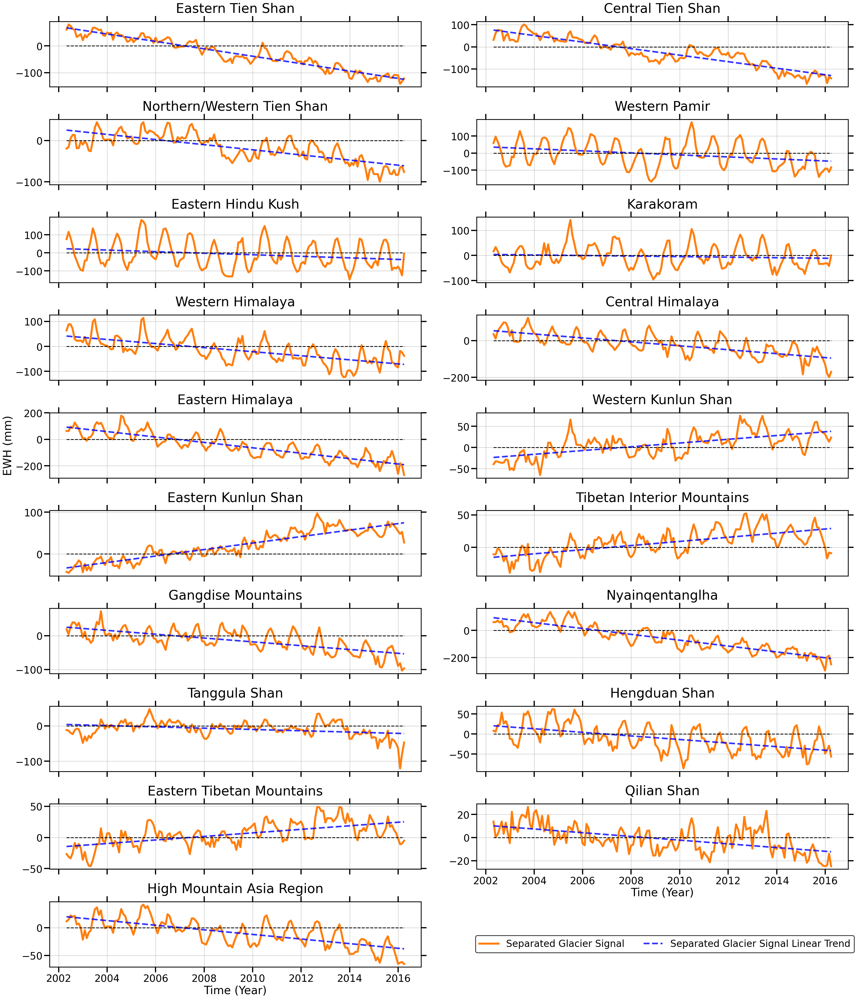

In [87]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as mdates

# Define datasets and their corresponding colors
datasets = {
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_withAnomaliesWGH.csv",  # date column renamed as time to make consistency with others
}

dataset_colors = {
    "GRACE signal": "#1f77b4",         # Blue
    "Separated Glacier Signal": "#ff7f0e",   # Orange
    "Hydrological Signal": "#2ca02c"         # Green
}

# Load region metadata and define consistent order
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha',
        'Gangdise Mountains', 'Hengduan Shan', 'Tibetan Interior Mountains', 'Tanggula Shan',
        'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan', 'Eastern Tien Shan',
        'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load and preprocess all datasets
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]  # Ensure region order matches metadata

z_95 = 1.96  # z-score for 95% confidence interval

# Setup figure and axes: 10 rows 2 columns for 19 regions
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

# Generate x-ticks for every 2 years starting at lowest year
time_index = dfs[list(datasets.keys())[0]].index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

# For legend handle collection (legend will be added only in one axis)
handle_labels = {}

for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    ax = axes[i]
    
    for name, df in dfs.items():
        # Plot original monthly signal as a solid line
        raw_line, = ax.plot(
            df[region].index,
            df[region].values,
            color=dataset_colors[name],
            linestyle='-',
            linewidth=5,
            label=name
        )
        
        # --- Fit linear trend ---
        # Convert datetime index to float numbers for fitting
        x_num = mdates.date2num(df[region].index)
        y = df[region].values
        
        # Mask out NaNs
        mask = np.isfinite(y)
        if mask.sum() > 1:
            # Fit degree=1 polynomial (linear fit)
            p = np.polyfit(x_num[mask], y[mask], 1)  # p[0]=slope, p[1]=intercept
            
            # Calculate fitted linear trend values
            trend_line = p[0] * x_num + p[1]
            
            # Plot linear trend (red dashed line)
            trend_plot, = ax.plot(
                df[region].index,
                trend_line,
                color='blue',
                linestyle='--',
                linewidth=4,
                alpha=0.8,
                label=f"{name} Linear Trend"
            )

            # Collect handles only for first subplot for legend
            if i == 0:
                handle_labels[name] = raw_line
                handle_labels[f"{name} Linear Trend"] = trend_plot

    ax.set_title(region, fontsize=33, pad=22)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    ax.tick_params(axis='x', labelsize=25, direction='out', top=True, bottom=True, length=14, width=3)
    ax.tick_params(axis='y', labelsize=25, direction='out', left=True, right=True, length=14, width=3)
    ax.hlines(0, time_index.min(), time_index.max(), colors='k', linestyles='--', linewidth=2)

# Set thick black border for each axis
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

# Set axis labels
axes[8].set_ylabel('EWH (mm)', fontsize=28)
axes[17].set_xlabel('Time (Year)', fontsize=28)
axes[18].set_xlabel('Time (Year)', fontsize=28)
axes[17].tick_params(labelbottom=True)
axes[17].xaxis.get_label().set_visible(True)

# Add legend to one axis only (e.g., axes[18])
legend = axes[18].legend(
    handle_labels.values(),
    handle_labels.keys(),
    loc='center left',
    bbox_to_anchor=(1.134, 0.35),
    ncol=2,
    fontsize=24,
    frameon=True
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)
axes[18].tick_params(labelbottom=True)

# Remove unused subplots (for example if more subplots created than regions)
for j in range(len(region_metadata_sorted), len(axes)):
    fig.delaxes(axes[j])

# Final plot adjustments
plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)

# Uncomment to save figure
# plt.savefig(r'path_to_save\GlacierSignal_LinearTrend_timeseries.png', dpi=300, bbox_inches='tight')

plt.show()

--------------------
## Mass Anomaly in Gt
--------------------

In [53]:
glaciersignal_mmwe = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv')
glaciersignal_mmwe

,time,Dzhungarsky Alatau,Eastern Tien Shan,Central Tien Shan,Northern/Western Tien Shan,Pamir Alay,Western Pamir,Eastern Pamir,Eastern Hindu Kush,Karakoram,...,Eastern Kunlun Shan,Altun Shan,Tibetan Interior Mountains,Gangdise Mountains,Nyainqentanglha,Tanggula Shan,Hengduan Shan,Eastern Tibetan Mountains,Qilian Shan,High Mountain Asia Region
0,2002-04-30,-16.414677,56.417326,22.550132,-14.144241,5.136967,47.162300,8.200001,74.070736,13.123117,...,-48.370552,-8.560849,-8.092645,27.764802,60.084986,-11.388851,9.266231,-23.734160,1.127465,8.688661
1,2002-05-31,5.119994,72.159561,53.918960,-10.013519,23.355335,87.056095,16.448698,113.152887,30.862638,...,-51.155746,-12.995461,-8.323665,11.175470,62.453161,-15.139959,8.705127,-27.715673,-13.410981,12.277141
2,2002-06-30,43.894624,65.650874,72.000816,7.682100,23.918208,63.638280,2.685905,79.219716,16.305488,...,-44.603327,-12.083335,0.224790,29.981456,75.705823,-23.404015,24.896652,-31.027314,-11.668654,20.812115
3,2002-07-31,54.525869,57.837373,70.568428,15.397764,16.711739,31.374114,-10.938699,34.038198,-3.989771,...,-37.382585,-9.885064,-2.641113,40.345237,70.987049,-21.454684,28.995959,-23.777347,-6.409257,21.409492
4,2002-08-31,55.926738,54.327605,69.316769,14.791507,-3.796363,-12.357987,-25.045779,-20.204989,-27.496127,...,-28.411973,-7.860210,-8.231302,37.624418,85.650935,-7.203676,59.593789,-8.159788,-0.221370,24.181890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,2015-11-30,-71.400585,-108.905102,-133.264372,-83.353225,-142.474843,-111.328427,-31.304625,-84.120631,-28.841032,...,61.872649,33.658467,11.646842,-72.926543,-246.644729,-51.781654,-17.282965,7.127428,-19.934597,-51.687990
164,2015-12-31,-89.130152,-112.176962,-134.759663,-83.044859,-132.190500,-97.394134,-29.146784,-72.842551,-29.471742,...,53.679184,27.285319,1.742367,-95.753001,-289.424123,-65.087643,-50.762877,-1.668978,-21.245938,-66.505686
165,2016-01-31,-97.882240,-144.833524,-172.356764,-65.162741,-93.923356,-98.458007,-15.004295,-89.297691,-31.224416,...,46.895373,30.867454,-15.833191,-88.438733,-190.630779,-122.952583,-41.545584,-10.501118,-22.003777,-65.398698
166,2016-02-29,-112.473405,-136.375009,-145.324940,-62.514289,-73.207579,-119.291139,-27.276186,-118.853002,-44.762905,...,50.902475,43.215664,-6.868959,-109.205655,-182.097656,-83.157506,-30.687786,-9.010724,-13.871260,-64.836652


In [54]:
gdf_concat

,Primary_ID,Area,Shape_Area,Region_No,geometry
0,Eastern Hindu Kush,1.111471e+05,1.111471e+11,8,"POLYGON ((73.45158 36.98397, 73.44585 36.96572..."
1,Western Himalaya,2.115142e+05,2.115142e+11,10,"POLYGON ((75.78739 35.3156, 75.7874 35.3156, 7..."
2,Eastern Himalaya,1.669436e+05,1.669436e+11,12,"POLYGON ((95.22303 29.82187, 95.21352 29.80717..."
3,Central Himalaya,2.702681e+05,2.702681e+11,11,"POLYGON ((80.93559 30.70763, 80.98095 30.6962,..."
4,Karakoram,9.283049e+04,9.283049e+10,9,"POLYGON ((75.87358 37.3118, 75.89056 37.31113,..."
5,Western Pamir,1.248805e+05,1.248805e+11,6,"POLYGON ((73.91513 39.69697, 73.92109 39.68454..."
6,Pamir Alay,8.344443e+04,8.344443e+10,5,"POLYGON ((73.66215 40.58146, 73.727 40.56312, ..."
7,Northern/Western Tien Shan,2.057249e+05,2.057249e+11,4,"POLYGON ((83.06636 43.4915, 82.95135 43.44983,..."
8,Dzhungarsky Alatau,3.954317e+04,3.954317e+10,1,"POLYGON ((81.62713 44.61643, 81.28999 44.60156..."
9,Western Kunlun Shan,1.328130e+05,1.328130e+11,13,"POLYGON ((77.76951 37.37377, 78.24539 37.24774..."


In [55]:
# glaciersignal_mmwe: pandas DataFrame loaded with time index and sub-region columns
# area_df: DataFrame or GeoDataFrame with region names and Shape_Area in m²

# Set index on region name for area lookup; adjust 'region' to your actual column name
area_series = gdf_concat.set_index('Primary_ID')['Shape_Area']

# Prepare glacier signal DataFrame with time as index
mm_data = glaciersignal_mmwe.set_index('time')

# Ensure area order matches the column order of glacier signal
area = area_series.loc[mm_data.columns]

# Convert mm to Gt: multiply each region column by its area and divide by 1e12
signal_gt = mm_data.multiply(area, axis=1) / 1e12

# Optional: reset index if needed or save
signal_gt = signal_gt.reset_index()
signal_gt

,time,Dzhungarsky Alatau,Eastern Tien Shan,Central Tien Shan,Northern/Western Tien Shan,Pamir Alay,Western Pamir,Eastern Pamir,Eastern Hindu Kush,Karakoram,...,Eastern Kunlun Shan,Altun Shan,Tibetan Interior Mountains,Gangdise Mountains,Nyainqentanglha,Tanggula Shan,Hengduan Shan,Eastern Tibetan Mountains,Qilian Shan,High Mountain Asia Region
0,2002-04-30,-0.649088,8.135857,2.524423,-2.909823,0.428651,5.889652,0.360599,8.232745,1.218225,...,-12.628276,-0.481464,-4.418301,4.541338,10.441792,-1.664053,3.454429,-7.913747,0.227486,34.702321
1,2002-05-31,0.202461,10.406021,6.036074,-2.060030,1.948873,10.871609,0.723340,12.576611,2.864994,...,-13.355417,-0.730868,-4.544430,1.827911,10.853342,-2.212137,3.245251,-9.241314,-2.705898,49.034633
2,2002-06-30,1.735732,9.467413,8.060286,1.580399,1.995841,7.947180,0.118114,8.805039,1.513646,...,-11.644753,-0.679570,0.122727,4.903905,13.156439,-3.419618,9.281413,-10.345524,-2.354353,83.123129
3,2002-07-31,2.156125,8.340640,7.899934,3.167704,1.394501,3.918015,-0.481035,3.783246,-0.370372,...,-9.759608,-0.555938,-1.441955,6.599052,12.336393,-3.134797,10.809625,-7.928147,-1.293179,85.509043
4,2002-08-31,2.211520,7.834502,7.759814,3.042981,-0.316785,-1.543272,-1.101402,-2.245725,-2.552479,...,-7.417617,-0.442060,-4.494003,6.154022,14.884738,-1.052547,22.216424,-2.720741,-0.044665,96.581937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,2015-11-30,-2.823405,-15.705040,-14.918566,-17.147835,-11.888731,-13.902750,-1.376638,-9.349761,-2.677327,...,16.153318,1.892960,6.358768,-11.928200,-42.862837,-7.565945,-6.443048,2.376518,-4.022151,-206.440695
164,2015-12-31,-3.524488,-16.176870,-15.085959,-17.084397,-11.030560,-12.162628,-1.281745,-8.096235,-2.735876,...,14.014220,1.534533,0.951271,-15.661800,-50.297199,-9.510116,-18.924281,-0.556492,-4.286737,-265.622247
165,2016-01-31,-3.870574,-20.886224,-19.294847,-13.405599,-7.837381,-12.295485,-0.659822,-9.925176,-2.898578,...,12.243146,1.735993,-8.644368,-14.465445,-33.128525,-17.964904,-15.488096,-3.501417,-4.439644,-261.200963
166,2016-02-29,-4.447555,-19.666434,-16.268712,-12.860747,-6.108764,-14.897137,-1.199485,-13.210162,-4.155362,...,13.289295,2.430459,-3.750211,-17.862178,-31.645607,-12.150348,-11.440334,-3.004471,-2.798767,-258.956162


In [56]:
signal_gt.to_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', index=False)

In [57]:
pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv')

,time,Dzhungarsky Alatau,Eastern Tien Shan,Central Tien Shan,Northern/Western Tien Shan,Pamir Alay,Western Pamir,Eastern Pamir,Eastern Hindu Kush,Karakoram,...,Eastern Kunlun Shan,Altun Shan,Tibetan Interior Mountains,Gangdise Mountains,Nyainqentanglha,Tanggula Shan,Hengduan Shan,Eastern Tibetan Mountains,Qilian Shan,High Mountain Asia Region
0,2002-04-30,-0.649088,8.135857,2.524423,-2.909823,0.428651,5.889652,0.360599,8.232745,1.218225,...,-12.628276,-0.481464,-4.418301,4.541338,10.441792,-1.664053,3.454429,-7.913747,0.227486,34.702321
1,2002-05-31,0.202461,10.406021,6.036074,-2.060030,1.948873,10.871609,0.723340,12.576611,2.864994,...,-13.355417,-0.730868,-4.544430,1.827911,10.853342,-2.212137,3.245251,-9.241314,-2.705898,49.034633
2,2002-06-30,1.735732,9.467413,8.060286,1.580399,1.995841,7.947180,0.118114,8.805039,1.513646,...,-11.644753,-0.679570,0.122727,4.903905,13.156439,-3.419618,9.281413,-10.345524,-2.354353,83.123129
3,2002-07-31,2.156125,8.340640,7.899934,3.167704,1.394501,3.918015,-0.481035,3.783246,-0.370372,...,-9.759608,-0.555938,-1.441955,6.599052,12.336393,-3.134797,10.809625,-7.928147,-1.293179,85.509043
4,2002-08-31,2.211520,7.834502,7.759814,3.042981,-0.316785,-1.543272,-1.101402,-2.245725,-2.552479,...,-7.417617,-0.442060,-4.494003,6.154022,14.884738,-1.052547,22.216424,-2.720741,-0.044665,96.581937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,2015-11-30,-2.823405,-15.705040,-14.918566,-17.147835,-11.888731,-13.902750,-1.376638,-9.349761,-2.677327,...,16.153318,1.892960,6.358768,-11.928200,-42.862837,-7.565945,-6.443048,2.376518,-4.022151,-206.440695
164,2015-12-31,-3.524488,-16.176870,-15.085959,-17.084397,-11.030560,-12.162628,-1.281745,-8.096235,-2.735876,...,14.014220,1.534533,0.951271,-15.661800,-50.297199,-9.510116,-18.924281,-0.556492,-4.286737,-265.622247
165,2016-01-31,-3.870574,-20.886224,-19.294847,-13.405599,-7.837381,-12.295485,-0.659822,-9.925176,-2.898578,...,12.243146,1.735993,-8.644368,-14.465445,-33.128525,-17.964904,-15.488096,-3.501417,-4.439644,-261.200963
166,2016-02-29,-4.447555,-19.666434,-16.268712,-12.860747,-6.108764,-14.897137,-1.199485,-13.210162,-4.155362,...,13.289295,2.430459,-3.750211,-17.862178,-31.645607,-12.150348,-11.440334,-3.004471,-2.798767,-258.956162


In [58]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit

# Load your data
df = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv', parse_dates=['time'])



t_ns = df['time'].view('int64').values
YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9

def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semian = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semian

results = {}
uncertainties = {}

for region in df.columns.drop('time'):
    y = df[region].values
    mask = np.isfinite(y)
    if mask.sum() < 6:
        continue
    try:
        params, pcov = curve_fit(
            decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0]
        )
        results[region] = params
        # Standard error for parameter 'b' (linear trend) is sqrt(pcov[1, 1])
        if pcov is not None:
            sigma_b = np.sqrt(np.abs(pcov[1, 1]))
            uncertainties[region] = 2*sigma_b  # 2-sigma uncertainty
        else:
            uncertainties[region] = np.nan
    except RuntimeError:
        results[region] = [np.nan] * 6
        uncertainties[region] = np.nan

# Compile into a DataFrame for easy viewing
fit_df = pd.DataFrame(results, index=['a', 'b', 'c', 'd', 'e', 'f']).T
fit_df['linear_trend_2sigma'] = pd.Series(uncertainties)
fit_df.rename(columns={'b': 'linear_trend (Gt/yr)'}, inplace=True)

print(fit_df[['linear_trend (Gt/yr)', 'linear_trend_2sigma']])

                            linear_trend (Gt/yr)  linear_trend_2sigma
Dzhungarsky Alatau                     -0.256848             0.027086
Eastern Tien Shan                      -1.925449             0.073570
Central Tien Shan                      -1.630703             0.097181
Northern/Western Tien Shan             -1.287721             0.142491
Pamir Alay                             -0.521965             0.115867
Western Pamir                          -0.663043             0.203077
Eastern Pamir                          -0.039495             0.046413
Eastern Hindu Kush                     -0.331472             0.144272
Karakoram                              -0.020185             0.092189
Western Himalaya                       -1.855928             0.198581
Central Himalaya                       -2.796396             0.268270
Eastern Himalaya                       -3.373007             0.160947
Western Kunlun Shan                     0.615744             0.093101
Eastern Kunlun Shan 

In [59]:
fit_df

,a,linear_trend (Gt/yr),c,d,e,f,linear_trend_2sigma
Dzhungarsky Alatau,9.514921,-0.256848,-1.175593,-1.058452,0.083225,0.520213,0.027086
Eastern Tien Shan,71.207032,-1.925449,0.053841,-1.921651,-0.120380,0.392669,0.073570
Central Tien Shan,60.503634,-1.630703,-0.819345,-1.699737,0.023913,0.831630,0.097181
Northern/Western Tien Shan,47.184027,-1.287721,-0.222196,-3.055712,0.269950,1.556873,0.142491
Pamir Alay,19.106285,-0.521965,3.137172,-2.648979,0.034452,0.581491,0.115867
Western Pamir,24.259662,-0.663043,5.625790,-8.401973,-0.535452,2.459352,0.203077
Eastern Pamir,1.406234,-0.039495,0.689555,-0.976681,-0.193203,0.382294,0.046413
Eastern Hindu Kush,12.047451,-0.331472,3.843457,-9.175819,-1.005164,1.882487,0.144272
Karakoram,0.484092,-0.020185,1.433611,-4.357126,-0.390867,0.893871,0.092189
Western Himalaya,68.627092,-1.855928,-1.564343,-7.678425,-0.858720,2.551046,0.198581


In [60]:
fit_df['trend ± uncertainty (Gt/yr)'] = fit_df.apply(
    lambda row: f"{row['linear_trend (Gt/yr)']:.3f} ± {row['linear_trend_2sigma']:.3f}",
    axis=1
)

# extracted_df[['trend ± uncertainty (Gt/yr)']]
print(fit_df['trend ± uncertainty (Gt/yr)'])

Dzhungarsky Alatau             -0.257 ± 0.027
Eastern Tien Shan              -1.925 ± 0.074
Central Tien Shan              -1.631 ± 0.097
Northern/Western Tien Shan     -1.288 ± 0.142
Pamir Alay                     -0.522 ± 0.116
Western Pamir                  -0.663 ± 0.203
Eastern Pamir                  -0.039 ± 0.046
Eastern Hindu Kush             -0.331 ± 0.144
Karakoram                      -0.020 ± 0.092
Western Himalaya               -1.856 ± 0.199
Central Himalaya               -2.796 ± 0.268
Eastern Himalaya               -3.373 ± 0.161
Western Kunlun Shan             0.616 ± 0.093
Eastern Kunlun Shan             2.120 ± 0.134
Altun Shan                      0.173 ± 0.017
Tibetan Interior Mountains      1.764 ± 0.232
Gangdise Mountains             -0.890 ± 0.088
Nyainqentanglha                -3.594 ± 0.198
Tanggula Shan                  -0.294 ± 0.112
Hengduan Shan                  -1.686 ± 0.256
Eastern Tibetan Mountains       0.892 ± 0.152
Qilian Shan                    -0.

-----
---------

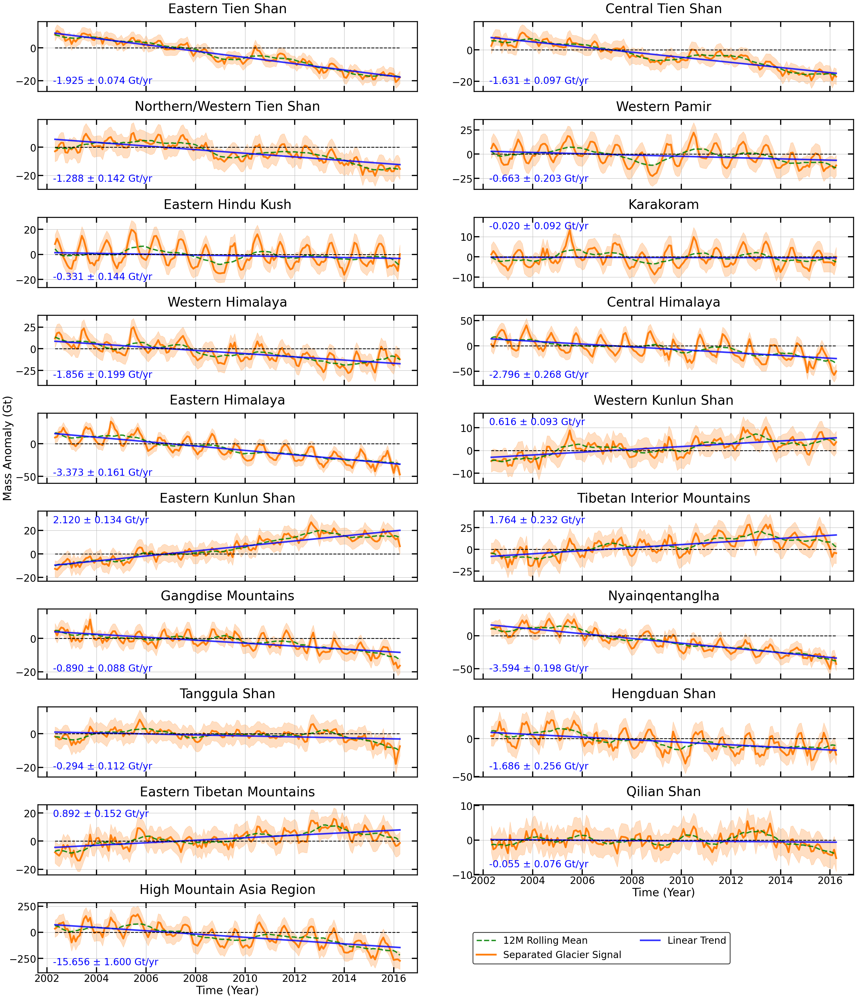

In [63]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as mdates
from scipy.optimize import curve_fit

# Load region trends and uncertainty table (make sure region/titles match!)
trends_df = pd.read_csv('VCEMascon_with_GIA_corr_glacier_subregion_trends_Gt_per_year_withUncertainty.csv')



# Set up lookup for region annotation
trend_lookup = trends_df.set_index('Primary_ID').to_dict(orient='index')

# Define datasets and colors
datasets = {
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv",
}



dataset_colors = {
    "Separated Glacier Signal": "#ff7f0e",  # Orange
}

# Load region metadata and sort by region_id
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha',
        'Gangdise Mountains', 'Hengduan Shan', 'Tibetan Interior Mountains', 'Tanggula Shan',
        'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan', 'Eastern Tien Shan',
        'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load glacier signal data with datetime index
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]

# Constants for time conversion to fractional years
YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9
t_ns = dfs["Separated Glacier Signal"].index.view('int64')

# Decomposition model: linear trend + annual & semiannual cycles
def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semi_annual = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semi_annual

# Setup plot axes: 10 rows x 2 cols for 19 regions
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

time_index = dfs["Separated Glacier Signal"].index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

handle_labels = {}

for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    region_id = row['region_id']
    ax = axes[i]
    df = dfs["Separated Glacier Signal"]
    y = df[region].values
    mask = np.isfinite(y)

    # Plot original monthly glacier signal
    raw_line, = ax.plot(
        df.index,
        y,
        color=dataset_colors["Separated Glacier Signal"],
        linestyle='-',
        # marker='o',
        linewidth=4.5,
        label="Separated Glacier Signal"
    )

    # --- Plot 12-month moving average (green line)
    roll_mean = df[region].rolling(window=12, center=True, min_periods=1).mean()
    roll_line, = ax.plot(
        roll_mean.index, roll_mean.values,
        color='green',
        linewidth=3.5,
        alpha=0.85,
        linestyle='--',
        label="12M Rolling Mean"
    )
    if i == 0:
        handle_labels["12M Rolling Mean"] = roll_line

    if mask.sum() > 6:
        try:
            # Fit decomposition model to monthly data
            params, _ = curve_fit(decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0])
            a, b, c, d, e, f = params

            # Compute fitted model values over full time series
            fitted_curve = decomp_func(t_ns, *params)

            # Residuals = original - fitted
            residuals = y - fitted_curve
            resid_std = np.nanstd(residuals)

            # Linear trend line a + b*t (t in fractional years)
            t_fractional = t_ns / YEAR_NS
            linear_trend = a + b * t_fractional

            # Plot linear trend line (blue dashed)
            trend_plot, = ax.plot(
                df.index,
                linear_trend,
                color='blue',
                linestyle='-',
                linewidth=4,
                alpha=0.8,
                label="Linear Trend"
            )

            # Plot uncertainty envelope around fitted curve: ± 2 sigma of residuals
            upper_bound = y + 2 * resid_std
            lower_bound = y - 2 * resid_std

            ax.fill_between(
                df.index,
                lower_bound,
                upper_bound,
                color=dataset_colors["Separated Glacier Signal"],
                alpha=0.25,
                label="Uncertainty Envelope" if i == 0 else None
            )

            # Collect handles for legend only once
            if i == 0:
                handle_labels["Separated Glacier Signal"] = raw_line
                handle_labels["Linear Trend"] = trend_plot

        except RuntimeError:
            # If fit fails, skip plotting trend and envelope
            pass
    # ---- Annotation: Linear trend/uncertainty for region ----
    info = trend_lookup.get(region, None)
    if info is not None:
        annotation = f"{info['trend ± uncertainty (Gt/yr)']} Gt/yr"

        # Lower left (axes fraction coords)
        x_pos, y_pos = 0.04, 0.08
        if i in [5, 9, 10, 11, 16]:
            x_pos, y_pos = 0.04, 0.8
        ax.text(
            x_pos, y_pos, annotation,
            transform=ax.transAxes,
            fontsize=24,
            verticalalignment='bottom',
            color='blue', 
            horizontalalignment='left'
            # bbox=dict(facecolor='white', alpha=0.6, edgecolor='black', boxstyle='round,pad=0.3')
        )


    ax.set_title(region, fontsize=33, pad=22)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    ax.tick_params(axis='x', labelsize=25, direction='in', top=True, bottom=True, length=14, width=3)
    ax.tick_params(axis='y', labelsize=25, direction='in', left=True, right=True, length=14, width=3)
    ax.hlines(0, time_index.min(), time_index.max(), colors='k', linestyles='--', linewidth=2)

# Set thick black border for each subplot
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2.5)
        spine.set_edgecolor('black')

# Set axis labels
axes[8].set_ylabel('Mass Anomaly (Gt)', fontsize=28)
axes[17].set_xlabel('Time (Year)', fontsize=28)
axes[18].set_xlabel('Time (Year)', fontsize=28)
axes[17].tick_params(labelbottom=True)
axes[17].xaxis.get_label().set_visible(True)

# Legend on one axis (e.g., axes[18])
legend = axes[18].legend(
    handle_labels.values(),
    handle_labels.keys(),
    loc='center left',
    bbox_to_anchor=(1.134, 0.35),
    ncol=2,
    fontsize=24,
    frameon=True
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)
axes[18].tick_params(labelbottom=True)

# Remove unused subplots if extra
for j in range(len(region_metadata_sorted), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)

# Uncomment to save figure:
plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_TimeSeries/GlacierSignal_VCEMascon_GIA_corr_LinearTrend_MovingAverage_withEnvelope.png', dpi=300, bbox_inches='tight')

plt.show()

## Unnecessary Things

In [174]:
df = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_withAnomaliesWGH.csv')
df

,time,Dzhungarsky Alatau,Eastern Tien Shan,Central Tien Shan,Northern/Western Tien Shan,Pamir Alay,Western Pamir,Eastern Pamir,Eastern Hindu Kush,Karakoram,...,Eastern Kunlun Shan,Altun Shan,Tibetan Interior Mountains,Gangdise Mountains,Nyainqentanglha,Tanggula Shan,Hengduan Shan,Eastern Tibetan Mountains,Qilian Shan,High Mountain Asia Region
0,2002-04-30,-0.539517,8.757777,3.526617,-3.995014,0.283869,7.381508,0.307778,8.491662,1.520143,...,-11.261308,-0.330101,-5.883378,3.078968,10.478958,-1.715817,3.017612,-8.916265,2.787354,45.210802
1,2002-05-31,0.368138,11.520080,6.941753,-3.229123,1.955082,12.056582,0.804082,12.947385,3.110710,...,-11.843985,-0.579187,-6.022741,0.676090,10.606915,-1.969793,2.117219,-10.306930,0.073793,56.662889
2,2002-06-30,1.763595,10.693520,8.543544,0.994863,2.071076,8.630360,0.357518,9.249224,1.695252,...,-10.447708,-0.555520,-1.013221,4.367359,12.425625,-2.894331,8.195912,-11.251127,0.526145,87.414619
3,2002-07-31,2.045681,9.242598,8.382018,2.758664,1.359027,4.593364,-0.191273,4.282321,-0.192950,...,-9.337578,-0.475820,-2.138918,6.429586,10.007479,-3.412914,8.518817,-8.313197,1.546756,77.887496
4,2002-08-31,2.049429,8.452564,8.253314,2.741515,-0.400551,-0.713511,-0.701146,-1.717543,-2.555635,...,-7.260847,-0.397841,-5.452136,6.330722,11.904734,-1.772460,19.901366,-2.932011,2.795460,83.822540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,2015-11-30,-2.909285,-15.699684,-14.249032,-17.170992,-11.157480,-13.465241,-1.119557,-9.676955,-3.151135,...,16.158433,1.849940,5.623081,-10.980654,-44.422710,-7.295946,-5.938273,2.500505,-4.915134,-207.289798
164,2015-12-31,-3.553921,-15.869211,-14.244141,-17.086157,-10.443903,-11.505408,-1.110221,-8.472204,-2.952862,...,14.186226,1.494308,0.257072,-14.664901,-51.387669,-9.170569,-18.179241,-0.549879,-5.002885,-260.234445
165,2016-01-31,-3.791424,-20.446469,-18.392572,-13.423282,-7.608453,-11.438602,-0.547106,-10.469537,-2.887433,...,12.568651,1.698082,-9.307236,-13.343560,-33.913674,-17.560164,-14.715532,-3.642121,-4.861536,-251.761947
166,2016-02-29,-4.335521,-19.156841,-15.298185,-12.836260,-6.239286,-13.962509,-1.116716,-13.877475,-3.866106,...,13.752819,2.393649,-4.406349,-16.929188,-32.255251,-11.680768,-10.895128,-3.319148,-2.811481,-247.296259


In [177]:
u = df['High Mountain Asia Region']

In [178]:
import pandas as pd
from scipy import stats

# Load your data
df = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_withAnomaliesWGH.csv')

# Convert 'time' column to pandas datetime if not already
df['time'] = pd.to_datetime(df['time'])

# Function to convert datetime to fractional year
def datetime_to_frac_year(dt):
    year = dt.year
    start_of_year = pd.Timestamp(year=year, month=1, day=1)
    start_next_year = pd.Timestamp(year=year + 1, month=1, day=1)
    year_elapsed = (dt - start_of_year).total_seconds()
    year_duration = (start_next_year - start_of_year).total_seconds()
    return year + year_elapsed / year_duration

# Apply function to create 'frac_year' column
df['frac_year'] = df['time'].apply(datetime_to_frac_year)

# Extract glacier signal series for regression
u = df['High Mountain Asia Region'].values
z = df['frac_year'].values

# Run the linear regression: u (signal) vs z (fractional years)
slope, intercept, r_value, p_value, std_err = stats.linregress(z, u)

print(f"Linear Regression Results:")
print(f"  Slope (Gt/year): {slope}")
print(f"  Intercept (Gt): {intercept}")
print(f"  R-squared: {r_value ** 2}")
print(f"  p-value: {p_value}")
print(f"  Standard error: {std_err}")


Linear Regression Results:
  Slope (Gt/year): -16.5493096754542
  Intercept (Gt): 33214.964917921956
  R-squared: 0.5081638366384915
  p-value: 2.2743675995653067e-27
  Standard error: 1.2636714976728047


array([  45.21080154,   56.66288932,   87.41461855,   77.88749583,
         83.82253986,   22.16459737,   28.88739811,   -0.91863879,
        -86.47195328,  -19.25921109,  -75.40641865,  -35.27007443,
        -19.94346296,   66.06567071,  130.30021246,  145.38496634,
         91.33582055,  123.2820217 ,   37.58136589,   -4.87148646,
          7.40381464,    7.96558113,    7.27872134,  -37.19105901,
         47.9890523 ,   49.52323642,   62.92614461,  133.26248765,
         97.55570706,   82.35139286,   29.5406501 ,   19.49432477,
         -7.1045752 ,  -50.65620718,   -6.63392014,   52.10089839,
         69.68734203,  151.49904709,  164.80787702,  139.30210783,
        154.54579113,  121.8600326 ,   80.12945309,   34.07607559,
         -0.90451286,  -40.76808445,    6.95870458,   39.18964327,
         31.8448688 ,   22.24244969,   96.18622094,   81.81707313,
         32.01479663,   11.31953908,  -28.80641721,  -17.42960456,
        -13.06466765,  -29.05880493,  -22.09939331,    3.56243

In [181]:
z

array([2002.3260274 , 2002.4109589 , 2002.49315068, 2002.57808219,
       2002.6630137 , 2002.74520548, 2002.83013699, 2002.91232877,
       2002.99726027, 2003.08219178, 2003.15890411, 2003.24383562,
       2003.3260274 , 2003.4109589 , 2003.49315068, 2003.57808219,
       2003.6630137 , 2003.74520548, 2003.83013699, 2003.91232877,
       2003.99726027, 2004.08196721, 2004.16120219, 2004.24590164,
       2004.32786885, 2004.41256831, 2004.49453552, 2004.57923497,
       2004.66393443, 2004.74590164, 2004.83060109, 2004.91256831,
       2004.99726776, 2005.08219178, 2005.15890411, 2005.24383562,
       2005.3260274 , 2005.4109589 , 2005.49315068, 2005.57808219,
       2005.6630137 , 2005.74520548, 2005.83013699, 2005.91232877,
       2005.99726027, 2006.08219178, 2006.15890411, 2006.24383562,
       2006.3260274 , 2006.4109589 , 2006.49315068, 2006.57808219,
       2006.6630137 , 2006.74520548, 2006.83013699, 2006.91232877,
       2006.99726027, 2007.08219178, 2007.15890411, 2007.24383

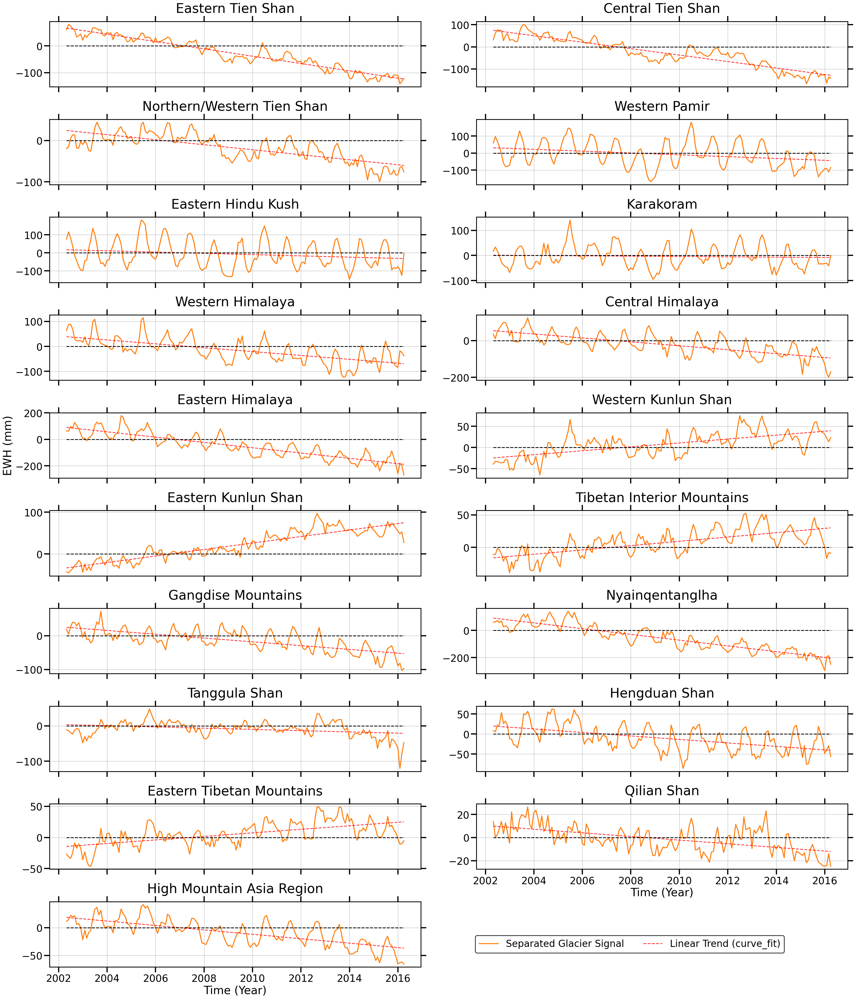

In [85]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as mdates
from scipy.optimize import curve_fit

# Define datasets and their corresponding colors
datasets = {
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_withAnomaliesWGH.csv",
}

dataset_colors = {
    "GRACE signal": "#1f77b4",         # Blue
    "Separated Glacier Signal": "#ff7f0e",   # Orange
    "Hydrological Signal": "#2ca02c"         # Green
}

# Load region metadata and define consistent order
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha',
        'Gangdise Mountains', 'Hengduan Shan', 'Tibetan Interior Mountains', 'Tanggula Shan',
        'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan', 'Eastern Tien Shan',
        'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load and preprocess datasets
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]  # ensure consistent order

# Constants for time conversion
t_ns = dfs["Separated Glacier Signal"].index.view('int64')
YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9

# Define decomposition function: linear + annual + semi-annual
def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semian = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semian

# Setup plot
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

time_index = dfs["Separated Glacier Signal"].index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

# For legend handle collection
handle_labels = {}

for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    ax = axes[i]
    
    df = dfs["Separated Glacier Signal"]
    y = df[region].values
    mask = np.isfinite(y)

    # Plot original monthly glacier signal
    raw_line, = ax.plot(
        df.index,
        y,
        color=dataset_colors["Separated Glacier Signal"],
        linestyle='-',
        linewidth=2.5,
        label="Separated Glacier Signal"
    )

    if mask.sum() > 6:
        try:
            # Fit the decomposition model to monthly data
            params, _ = curve_fit(decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0])
            a, b, c, d, e, f = params

            # Calculate linear trend line a + b*t (t in fractional years)
            t_fractional = t_ns / YEAR_NS
            linear_trend = a + b * t_fractional

            # Plot linear trend as a red dashed line
            trend_plot, = ax.plot(
                df.index,
                linear_trend,
                color='red',
                linestyle='--',
                linewidth=2,
                alpha=0.8,
                label="Linear Trend (curve_fit)"
            )

            # Collect handles only for first subplot for legend
            if i == 0:
                handle_labels["Separated Glacier Signal"] = raw_line
                handle_labels["Linear Trend (curve_fit)"] = trend_plot
        except RuntimeError:
            # If fitting fails, just skip trend plotting
            pass

    ax.set_title(region, fontsize=33, pad=22)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    ax.tick_params(axis='x', labelsize=25, direction='out', top=True, bottom=True, length=14, width=3)
    ax.tick_params(axis='y', labelsize=25, direction='out', left=True, right=True, length=14, width=3)
    ax.hlines(0, time_index.min(), time_index.max(), colors='k', linestyles='--', linewidth=2)

# Set thick black border for each axis
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

# Axis labels
axes[8].set_ylabel('EWH (mm)', fontsize=28)
axes[17].set_xlabel('Time (Year)', fontsize=28)
axes[18].set_xlabel('Time (Year)', fontsize=28)
axes[17].tick_params(labelbottom=True)
axes[17].xaxis.get_label().set_visible(True)

# Legend on one axis (e.g., axes[18])
legend = axes[18].legend(
    handle_labels.values(),
    handle_labels.keys(),
    loc='center left',
    bbox_to_anchor=(1.134, 0.35),
    ncol=2,
    fontsize=24,
    frameon=True
)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)
axes[18].tick_params(labelbottom=True)

# Remove unused subplots
for j in range(len(region_metadata_sorted), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)
plt.show()

In [171]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import STL
import statsmodels.api as sm

# Load your data
surface_density_glacier_data = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_withAnomaliesWGH.csv', parse_dates=['time'])
surface_density_glacier_data.set_index('time', inplace=True)

trend_results = {}
trend_slopes = {}
trend_uncertainties = {}

# Prepare time in years for regression (since first date)
time_years = (surface_density_glacier_data.index - surface_density_glacier_data.index[0]).days / 365.25

for region in surface_density_glacier_data.columns:
    series = surface_density_glacier_data[region]
    # STL decomposition to extract non-linear trend
    stl = STL(series, period=12, trend=167, robust=True)
    result = stl.fit()
    trend = result.trend
    trend_results[region] = trend

    # Optional: summarize the trend as a single long-term rate (m w.e./yr) with uncertainty
    X = sm.add_constant(time_years)
    model = sm.OLS(trend, X).fit()
    slope = model.params[1]
    slope_se = model.bse[1]
    trend_slopes[region] = slope
    trend_uncertainties[region] = slope_se

# Create a summary DataFrame
surface_density_glacier_data_trend_summary = pd.DataFrame({
    'long-term trend (kg m$^{-2}$ yr$^{-1}$)': trend_slopes,
    'uncertainty (±1σ)': trend_uncertainties
})
surface_density_glacier_data_trend_summary 

,long-term trend (kg m$^{-2}$ yr$^{-1}$),uncertainty (±1σ)
Dzhungarsky Alatau,-0.255774,0.001587
Eastern Tien Shan,-1.984032,0.003492
Central Tien Shan,-1.643088,0.005148
Northern/Western Tien Shan,-1.294905,0.016843
Pamir Alay,-0.509671,0.016426
Western Pamir,-0.681714,0.015222
Eastern Pamir,-0.036604,0.002627
Eastern Hindu Kush,-0.329630,0.002581
Karakoram,-0.053496,0.005373
Western Himalaya,-1.664400,0.004057


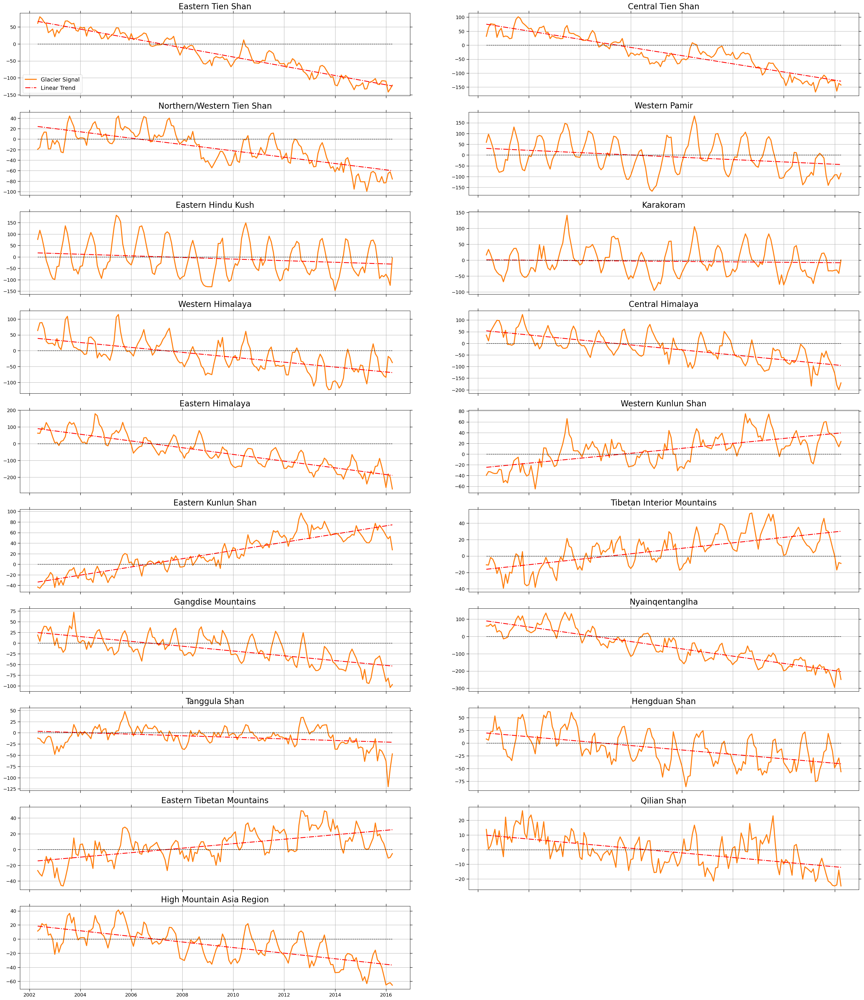

In [82]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit

# Dataset and colors as you have
datasets = {
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_withAnomaliesWGH.csv",
}

dataset_colors = {
    "Separated Glacier Signal": "#ff7f0e",
}

# Load region metadata and sort
region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha', 
        'Gangdise Mountains', 'Hengduan Shan', 'Tibetan Interior Mountains', 'Tanggula Shan', 
        'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan', 'Eastern Tien Shan', 
        'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load glacier signal data
df = pd.read_csv(datasets["Separated Glacier Signal"], parse_dates=['time'])
df.set_index('time', inplace=True)
df = df[sorted_regions]  # Ensure order matches

t_ns = df.index.view('int64')
YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9

def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semian = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semian


# Fit parameters for all regions
fit_params = {}
for region in df.columns:
    y = df[region].values
    mask = np.isfinite(y)
    if mask.sum() < 6:
        fit_params[region] = None
        continue
    try:
        params, _ = curve_fit(decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0])
        fit_params[region] = params
    except RuntimeError:
        fit_params[region] = None


# Set up plots
fig, axes = plt.subplots(10, 2, figsize=(30, 36), sharex=True, sharey=False)
axes = axes.flatten()

time_index = df.index
start_year = time_index.min().year
end_year = time_index.max().year
x_ticks = pd.date_range(start=f'{start_year}', end=f'{end_year}', freq='2YS')

for i, (_, row) in enumerate(region_metadata_sorted.iterrows()):
    region = row['region']
    ax = axes[i]
    y = df[region].values
    
    # Plot original monthly signal
    ax.plot(df.index, y, color=dataset_colors["Separated Glacier Signal"], linestyle='-', linewidth=2.5, label='Glacier Signal')

    # Plot fitted full signal (linear + seasonal) if fit succeeded
    params = fit_params.get(region)
    if params is not None:
        # fitted_signal = decomp_func(t_ns, *params)
        # ax.plot(df.index, fitted_signal, color='black', linestyle='--', linewidth=2, label='Fitted Signal')

        # Plot linear trend only: a + b*t
        a, b = params[0], params[1]
        linear_trend = a + b * (t_ns / YEAR_NS)
        ax.plot(df.index, linear_trend, color='red', linestyle='-.', linewidth=2, label='Linear Trend')

    ax.set_title(region, fontsize=20, pad=10)
    ax.grid(True)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([tick.year for tick in x_ticks], rotation=0)
    ax.tick_params(axis='x', labelsize=12, direction='out', top=True, bottom=True, length=6, width=1)
    ax.tick_params(axis='y', labelsize=12, direction='out', left=True, right=True, length=6, width=1)
    ax.hlines(0, df.index.min(), df.index.max(), colors='k', linestyles='--', linewidth=1)

# Remove unused axes
for j in range(len(region_metadata_sorted), len(axes)):
    fig.delaxes(axes[j])

# Create legend only on the first subplot
axes[0].legend(fontsize=14, loc='lower left', frameon=True)

plt.tight_layout()
plt.subplots_adjust(top=0.95, wspace=0.15)
plt.show()

In [79]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit

# Load glacier signal data CSV with 'time' column as datetime index
df = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_withAnomaliesWGH.csv', parse_dates=['time'])
df.set_index('time', inplace=True)

# Constants for time conversion: nanoseconds in one year
t_ns = df.index.view('int64')

YEAR_NS = 365.25 * 24 * 60 * 60 * 1e9

# Define decomposition function: linear + annual + semi-annual periodic terms
def decomp_func(t, a, b, c, d, e, f):
    t = t / YEAR_NS
    linear = a + b * t
    annual = c * np.sin(2 * np.pi * t) + d * np.cos(2 * np.pi * t)
    semian = e * np.sin(4 * np.pi * t) + f * np.cos(4 * np.pi * t)
    return linear + annual + semian

# DataFrame to hold monthly 2-sigma uncertainties per sub-region
uncertainty_monthly = pd.DataFrame(index=df.index)

# Loop through each sub-region column to fit model and calculate uncertainties
for region in df.columns:
    y = df[region].values
    mask = np.isfinite(y)  # mask valid (non-NaN) data points

    if mask.sum() < 6:
        # Too few valid points to fit a model, skip this region
        continue

    try:
        # Fit model to observed data in region
        params, _ = curve_fit(decomp_func, t_ns[mask], y[mask], p0=[np.nanmean(y), 0, 0, 0, 0, 0])

        # Calculate fitted values and residuals for all time points
        fitted = decomp_func(t_ns, *params)
        residuals = y - fitted
        
        # Create temporary DataFrame with residuals and timestamps
        temp_df = pd.DataFrame({
            'residuals': residuals,
            'time': df.index
        })

        # Extract year and month for grouping
        temp_df['year'] = temp_df['time'].dt.year
        temp_df['month'] = temp_df['time'].dt.month

        # Compute std dev of residuals grouped by year and month (monthly time-varying uncertainty)
        monthly_std = temp_df.groupby(['year', 'month'])['residuals'].std()

        # Create datetime index for months (set day=15 as mid-month)
        monthly_dates = pd.to_datetime({
            'year': monthly_std.index.get_level_values(0),
            'month': monthly_std.index.get_level_values(1),
            'day': 15
        })
        monthly_std.index = monthly_dates

        # Reindex monthly std dev to match original daily time index by nearest date
        monthly_std_full = monthly_std.reindex(df.index, method='nearest')

        # Multiply by 2 for 2-sigma uncertainties and assign to output DataFrame
        uncertainty_monthly[region] = 2 * monthly_std_full

    except RuntimeError:
        # Curve fitting failed for this region: assign NaNs
        uncertainty_monthly[region] = np.nan

# Now `uncertainty_monthly` contains sub-region columns with monthly 2-sigma uncertainty time series,
# indexed by your original dates (monthly timestamps).

# Optional: save uncertainties to CSV
uncertainty_monthly.to_csv('GlacierSignal_Monthly_2sigma_Uncertainties.csv')

print("Monthly glacier signal uncertainties for each sub-region have been calculated and saved.")

Monthly glacier signal uncertainties for each sub-region have been calculated and saved.


In [73]:
pd.read_csv('GlacierSignal_Monthly_2sigma_Uncertainties.csv')

,time,Dzhungarsky Alatau,Eastern Tien Shan,Central Tien Shan,Northern/Western Tien Shan,Pamir Alay,Western Pamir,Eastern Pamir,Eastern Hindu Kush,Karakoram,...,Eastern Kunlun Shan,Altun Shan,Tibetan Interior Mountains,Gangdise Mountains,Nyainqentanglha,Tanggula Shan,Hengduan Shan,Eastern Tibetan Mountains,Qilian Shan,High Mountain Asia Region
0,2002-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2002-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2002-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2002-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2002-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,2015-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
164,2015-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
165,2016-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
166,2016-02-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Unnecesary Things Above

-------
--------

## Error bar

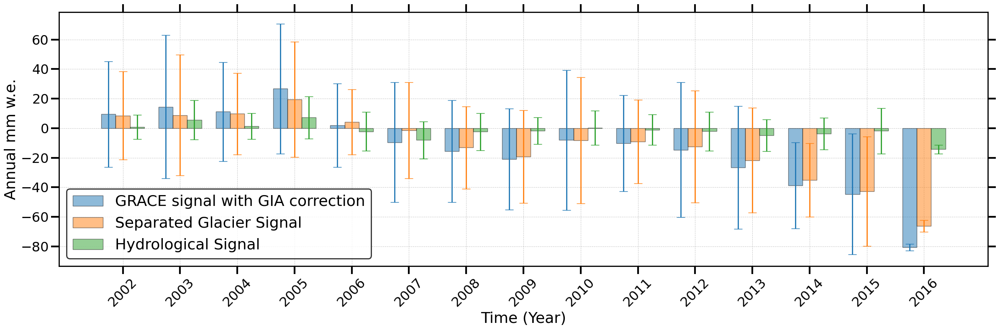

In [66]:
# --- Load datasets as in your code ---
datasets = {
    "GRACE signal with GIA correction": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/New_EnsembleWeightedAverageMascon1.csv",
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv", #date column renamed as time to make consistency with others
    "Hydrological Signal": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/WGAP_HM/New_HMA_RegionalAvergaed_anomalies_wghTWS.csv" #New_HMA_RegionalAvergaed_anomalies_wghTWS.csv
}

dataset_colors = {
    "GRACE signal with GIA correction": "#1f77b4",       # Blue
    "Separated Glacier Signal": "#ff7f0e",   # Orange
    "Hydrological Signal": "#2ca02c"         # Green
}

# Load all datasets into DataFrames
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df

# ---- Select region (example: 'Eastern Hindu Kush') ----
region = 'High Mountain Asia Region'  # Change as needed

# ---- Prepare annual means and stds for each signal ----
annual_means = {}
annual_stds = {}
for name in datasets.keys():
    # Get the monthly time series for the region
    series = dfs[name][region]
    # Resample to annual mean and std
    annual_mean = series.resample('Y').mean()
    annual_std = series.resample('Y').std()
    annual_means[name] = annual_mean
    annual_stds[name] = annual_std

# ---- Prepare data for plotting ----
years = annual_means["GRACE signal with GIA correction"].index.year
signals = ["GRACE signal with GIA correction", "Separated Glacier Signal", "Hydrological Signal"]
colors = [dataset_colors[s] for s in signals]

x = np.arange(len(years))
bar_width = 0.25

fig, ax = plt.subplots(figsize=(24, 8))

for i, (signal, color) in enumerate(zip(signals, colors)):
    ax.bar(
        x + i * bar_width,
        annual_means[signal],
        width=bar_width,
        yerr=2 * annual_stds[signal],  # 2-sigma error bars
        label=signal,
        color=color,
        capsize=5,
        edgecolor='black',
        alpha=0.5,
        error_kw=dict(ecolor=color, capsize=7, elinewidth=2)  # Error bar color matches bar color
    )

# ---- Formatting ----
ax.set_xticks(x + bar_width)
ax.set_xticklabels(years, rotation=45, fontsize=23)
# ax.tick_params(axis='y', labelsize=23) 

ax.tick_params(axis='x', labelsize=23, direction='out', top=True, bottom=True, length=14, width=3)
ax.tick_params(axis='y', labelsize=23, direction='out', left=True, right=True, length=14, width=3)

ax.set_ylabel("Annual mm w.e.", fontsize=26)
ax.set_xlabel("Time (Year)", fontsize=26)
#  ax.set_title(f"Annual Contributions of Glacier, Hydrological, and GRACE Signals\n({region})", fontsize=16, pad=15)
legend = ax.legend(fontsize=26, loc="lower left")
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)

ax.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
ax.grid(axis='x', linestyle='--', linewidth=0.7, alpha=0.7)
ax.set_axisbelow(True)

for spine in ax.spines.values():        # Thicken and darken subplot edge
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

plt.tight_layout()

plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_Others/Error_Bar_GRACESignalwithGIACorr_glaciersignal_HS__VCEMascon_GIA_corr.png', dpi=300, bbox_inches='tight')
plt.show()

## Bar Chart

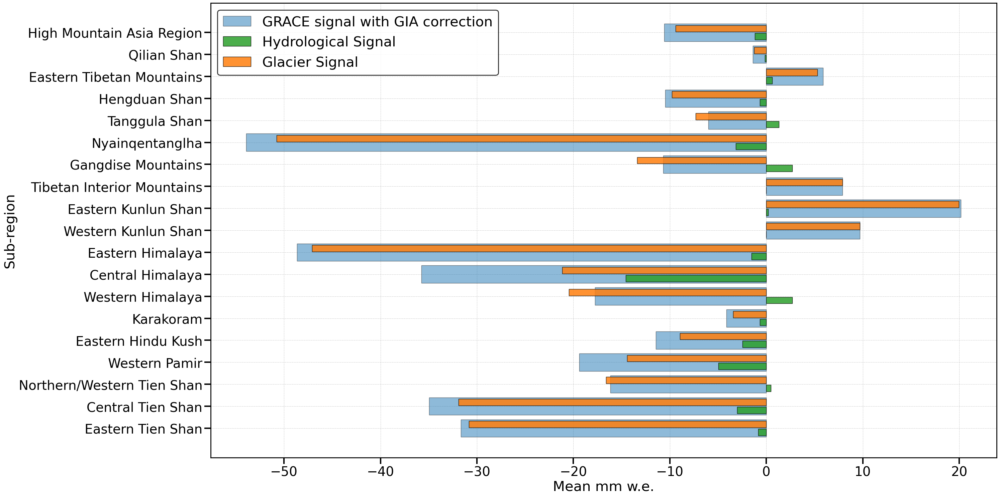

In [70]:
# --- Load data as in your code ---
datasets = {
    "GRACE signal with GIA correction": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/Mascon_approach/New_EnsembleWeightedAverageMascon1.csv",
    "Separated Glacier Signal": "Updated_HMA_RegionalAveraged_TWS_GlacierSignal_for_VCEMascon_with_GIA_corr_withAnomaliesWGH.csv", #date column renamed as time to make consistency with others
    "Hydrological Signal": "D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Output_Data/WGAP_HM/New_HMA_RegionalAvergaed_anomalies_wghTWS.csv" #New_HMA_RegionalAvergaed_anomalies_wghTWS.csv
}

dataset_colors = {
    "GRACE signal with GIA correction": "#1f77b4",       # Blue
    "Separated Glacier Signal": "#ff7f0e",   # Orange
    "Hydrological Signal": "#2ca02c"         # Green
}


region_metadata = pd.DataFrame({
    'region': [
        'Eastern Hindu Kush', 'Western Himalaya', 'Eastern Himalaya', 'Central Himalaya', 'Karakoram',
        'Western Pamir', 'Northern/Western Tien Shan', 'Western Kunlun Shan', 'Nyainqentanglha', 'Gangdise Mountains', 'Hengduan Shan',
        'Tibetan Interior Mountains', 'Tanggula Shan', 'Eastern Tibetan Mountains', 'Qilian Shan', 'Eastern Kunlun Shan',
        'Eastern Tien Shan', 'Central Tien Shan', 'High Mountain Asia Region'
    ],
    'region_id': [8, 10, 12, 11, 9, 6, 4, 13, 18, 17, 20, 16, 19, 21, 22, 14, 2, 3, 23]
})
region_metadata_sorted = region_metadata.sort_values(by='region_id')
sorted_regions = region_metadata_sorted['region'].values

# Load and preprocess all datasets
dfs = {}
for name, file in datasets.items():
    df = pd.read_csv(file)
    df['time'] = pd.to_datetime(df['time'])
    df.set_index('time', inplace=True)
    dfs[name] = df[sorted_regions]  # Ensure consistent region order

# --- Calculate mean for each signal and region ---
glacier_means = dfs["Separated Glacier Signal"].mean()
hydro_means = dfs["Hydrological Signal"].mean()
grace_means = dfs["GRACE signal with GIA correction"].mean()


# --- Assume your data loading and mean calculation as before ---

# y positions for each region
y = np.arange(len(sorted_regions))
bar_height_grace = 0.8
bar_height_component = 0.3

# Offsets for side-by-side bars
offset = 0.18  # Adjust for spacing

fig, ax = plt.subplots(figsize=(30, 15))

# 1. Plot GRACE signal as the widest, centered bar
ax.barh(
    y,
    grace_means[sorted_regions],
    height=bar_height_grace,
    color=dataset_colors["GRACE signal with GIA correction"],
    edgecolor='black',
    label="GRACE signal with GIA correction",
    alpha=0.5,
    zorder=1
)

# 2. Plot Hydrological signal, shifted up
ax.barh(
    y - offset,
    hydro_means[sorted_regions],
    height=bar_height_component,
    color=dataset_colors["Hydrological Signal"],
    edgecolor='black',
    label="Hydrological Signal",
    alpha=0.85,
    zorder=2
)

# 3. Plot Glacier signal, shifted down
ax.barh(
    y + offset,
    glacier_means[sorted_regions],
    height=bar_height_component,
    color=dataset_colors["Separated Glacier Signal"],
    edgecolor='black',
    label="Glacier Signal",
    alpha=0.85,
    zorder=3
)

# --- Formatting ---
ax.set_yticks(y)


ax.tick_params(axis='x', labelsize=28, direction='out', top=False, bottom=True, length=14, width=3)
ax.tick_params(axis='y', labelsize=28, direction='out', left=True, right=False, length=14, width=3)


ax.set_yticklabels(sorted_regions, fontsize=28)


ax.set_xlabel("Mean mm w.e.", fontsize=30)
ax.set_ylabel("Sub-region", fontsize=30)
#ax.set_title("Mean GRACE, Hydrological, and Glacier Signal Contributions\nfor Each High Mountain Asia Sub-region", fontsize=16, pad=15)

# Avoid duplicate legend entries
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
# ax.legend(by_label.values(), by_label.keys(), loc="lower right", fontsize=12)

legend = ax.legend(fontsize=30, loc="upper left")
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(2)

ax.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
ax.grid(axis='x', linestyle='--', linewidth=0.7, alpha=0.7)
ax.set_axisbelow(True)

for spine in ax.spines.values():        # Thicken and darken subplot edge
    spine.set_linewidth(2)
    spine.set_edgecolor('black')


plt.tight_layout()
plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_Others/BarChart_GS_HS_GRACE_Signal_with_GIA_Corr_VCE_Mascon_Approach.png', dpi=300, bbox_inches='tight')
plt.show()

--------
## LINEAR TREND USING STL DECOMPOSITION
--------

In [7]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import STL
import statsmodels.api as sm

# Load your data
glacier_data = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_withAnomaliesWGH.csv', parse_dates=['time'])
glacier_data.set_index('time', inplace=True)

trend_results = {}
trend_slopes = {}
trend_uncertainties = {}

# Prepare time in years for regression (since first date)
time_years = (glacier_data.index - glacier_data.index[0]).days / 365.25

for region in glacier_data.columns:
    series = glacier_data[region]
    # STL decomposition to extract non-linear trend
    stl = STL(series, period=12, trend=167, robust=True)
    result = stl.fit()
    trend = result.trend
    trend_results[region] = trend

    # Optional: summarize the trend as a single long-term rate (m w.e./yr) with uncertainty
    X = sm.add_constant(time_years)
    model = sm.OLS(trend, X).fit()
    slope = model.params[1]
    slope_se = model.bse[1]
    trend_slopes[region] = slope
    trend_uncertainties[region] = slope_se

# Create a summary DataFrame
trend_summary = pd.DataFrame({
    'long-term trend (mm w.e./yr)': trend_slopes,
    'uncertainty (±1σ)': trend_uncertainties
})
trend_summary 

,long-term trend (mm w.e./yr),uncertainty (±1σ)
Dzhungarsky Alatau,-6.468229,0.040145
Eastern Tien Shan,-13.758078,0.024214
Central Tien Shan,-14.677359,0.045987
Northern/Western Tien Shan,-6.294353,0.081872
Pamir Alay,-6.107911,0.196851
Western Pamir,-5.458927,0.121895
Eastern Pamir,-0.832370,0.059736
Eastern Hindu Kush,-2.965713,0.023225
Karakoram,-0.576276,0.057880
Western Himalaya,-7.868976,0.019182


In [194]:
# Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_withAnomaliesWGH.csv

In [172]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import STL
import statsmodels.api as sm

# Load your data
glacier_data = pd.read_csv('Updated_HMA_RegionalAveraged_TWS_GlacierSignal_inGT_withAnomaliesWGH.csv', parse_dates=['time'])
glacier_data.set_index('time', inplace=True)

trend_results = {}
trend_slopes = {}
trend_uncertainties = {}

# Prepare time in years for regression (since first date)
time_years = (glacier_data.index - glacier_data.index[0]).days / 365.25

for region in glacier_data.columns:
    series = glacier_data[region]
    # STL decomposition to extract non-linear trend
    stl = STL(series, period=12, trend=167, robust=True)
    result = stl.fit()
    trend = result.trend
    trend_results[region] = trend

    # Optional: summarize the trend as a single long-term rate (m w.e./yr) with uncertainty
    X = sm.add_constant(time_years)
    model = sm.OLS(trend, X).fit()
    slope = model.params[1]
    slope_se = model.bse[1]
    trend_slopes[region] = slope
    trend_uncertainties[region] = slope_se

# Create a summary DataFrame
trend_summary = pd.DataFrame({
    'long-term trend (mm w.e./yr)': trend_slopes,
    'uncertainty (±1σ)': trend_uncertainties
})
trend_summary 

,long-term trend (mm w.e./yr),uncertainty (±1σ)
Dzhungarsky Alatau,-0.255774,0.001587
Eastern Tien Shan,-1.984032,0.003492
Central Tien Shan,-1.643088,0.005148
Northern/Western Tien Shan,-1.294905,0.016843
Pamir Alay,-0.509671,0.016426
Western Pamir,-0.681714,0.015222
Eastern Pamir,-0.036604,0.002627
Eastern Hindu Kush,-0.329630,0.002581
Karakoram,-0.053496,0.005373
Western Himalaya,-1.664400,0.004057


-----
-------

## VLM TO GRAVITY SIGNALS

In [2]:
VLM_Rate = xr.open_dataset(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/VLM_Rate.nc')
VLM_Rate

<xarray.Dataset> Size: 4MB
Dimensions:   (lon: 1441, lat: 721)
Coordinates:
  * lon       (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8 360.0
  * lat       (lat) float64 6kB -90.0 -89.75 -89.5 -89.25 ... 89.5 89.75 90.0
Data variables:
    VLM_Rate  (lat, lon) float32 4MB ...
Attributes:
    Conventions:  CF-1.7
    title:        Interpolated Global Vertical Land Rate Models
    history:      gmt xyz2grd /home/bill/Science/XYZfiles14/vlm/GPSImaging/te...
    description:  
    GMT_version:  6.4.0 [64-bit]
    source:       Nevada Geodetic Laboratory (https://geodesy.unr.edu/vlm/VLM...
    Contact:      Sudur Bhattarai (uhkmj@kit.edu)

In [3]:
import numpy as np

# Total number of elements in the DataArray
total_count = VLM_Rate.VLM_Rate.size  # or gravity_da.values.size

# Count of non-NaN values
non_nan_count = VLM_Rate.VLM_Rate.count().item()  # counts non-NaN values over all dims

# Count of NaN values
nan_count = np.isnan(VLM_Rate.VLM_Rate.values).sum()

print(f"Total elements: {total_count}")
print(f"Non-NaN values: {non_nan_count}")
print(f"NaN values: {nan_count}")

Total elements: 1038961
Non-NaN values: 274333
NaN values: 764628


In [4]:
dr = VLM_Rate.VLM_Rate.values
dr

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(721, 1441), dtype=float32)

In [5]:
df_dr = VLM_Rate.VLM_Rate.to_dataframe()
df_dr

VLM_Rate
lat   lon             
-90.0 0.00         NaN
      0.25         NaN
      0.50         NaN
      0.75         NaN
      1.00         NaN
...                ...
 90.0 359.00       NaN
      359.25       NaN
      359.50       NaN
      359.75       NaN
      360.00       NaN

[1038961 rows x 1 columns]

In [6]:
df_dr.fillna(0, inplace=True)

In [7]:
# Assuming df_costg is your DataFrame
df_dr_back2nc = xr.Dataset.from_dataframe(df_dr)
df_dr_back2nc.to_netcdf("VLM_nan_filled.nc")
VLM_dr= xr.open_dataset('VLM_nan_filled.nc')
VLM_dr

<xarray.Dataset> Size: 4MB
Dimensions:   (lat: 721, lon: 1441)
Coordinates:
  * lat       (lat) float64 6kB -90.0 -89.75 -89.5 -89.25 ... 89.5 89.75 90.0
  * lon       (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8 360.0
Data variables:
    VLM_Rate  (lat, lon) float32 4MB ...

In [2]:
VLM_dr= xr.open_dataset('VLM_nan_filled.nc')
VLM_dr

<xarray.Dataset> Size: 4MB
Dimensions:   (lat: 721, lon: 1441)
Coordinates:
  * lat       (lat) float64 6kB -90.0 -89.75 -89.5 -89.25 ... 89.5 89.75 90.0
  * lon       (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8 360.0
Data variables:
    VLM_Rate  (lat, lon) float32 4MB ...

In [3]:
dr_m = VLM_dr.VLM_Rate/1000 ##mm->m
dr_m

<xarray.DataArray 'VLM_Rate' (lat: 721, lon: 1441)> Size: 4MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(721, 1441), dtype=float32)
Coordinates:
  * lat      (lat) float64 6kB -90.0 -89.75 -89.5 -89.25 ... 89.5 89.75 90.0
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8 360.0

In [4]:
dr_m.lon.values

array([0.0000e+00, 2.5000e-01, 5.0000e-01, ..., 3.5950e+02, 3.5975e+02,
       3.6000e+02], shape=(1441,))

In [5]:
dr_m.lat.values

array([-90.  , -89.75, -89.5 , -89.25, -89.  , -88.75, -88.5 , -88.25,
       -88.  , -87.75, -87.5 , -87.25, -87.  , -86.75, -86.5 , -86.25,
       -86.  , -85.75, -85.5 , -85.25, -85.  , -84.75, -84.5 , -84.25,
       -84.  , -83.75, -83.5 , -83.25, -83.  , -82.75, -82.5 , -82.25,
       -82.  , -81.75, -81.5 , -81.25, -81.  , -80.75, -80.5 , -80.25,
       -80.  , -79.75, -79.5 , -79.25, -79.  , -78.75, -78.5 , -78.25,
       -78.  , -77.75, -77.5 , -77.25, -77.  , -76.75, -76.5 , -76.25,
       -76.  , -75.75, -75.5 , -75.25, -75.  , -74.75, -74.5 , -74.25,
       -74.  , -73.75, -73.5 , -73.25, -73.  , -72.75, -72.5 , -72.25,
       -72.  , -71.75, -71.5 , -71.25, -71.  , -70.75, -70.5 , -70.25,
       -70.  , -69.75, -69.5 , -69.25, -69.  , -68.75, -68.5 , -68.25,
       -68.  , -67.75, -67.5 , -67.25, -67.  , -66.75, -66.5 , -66.25,
       -66.  , -65.75, -65.5 , -65.25, -65.  , -64.75, -64.5 , -64.25,
       -64.  , -63.75, -63.5 , -63.25, -63.  , -62.75, -62.5 , -62.25,
      

In [6]:
import numpy as np

# The data array
data = dr_m.values  # This is a NumPy array

# Count non-zero elements (exclude zeros)
non_zero_count = np.count_nonzero(data)

print(f"Non-zero values: {non_zero_count}")

Non-zero values: 274330


In [7]:
total_count = data.size
zero_count = total_count - np.count_nonzero(data)

print(f"Zero values: {zero_count}")

Zero values: 764631


In [8]:
dr_m

<xarray.DataArray 'VLM_Rate' (lat: 721, lon: 1441)> Size: 4MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(721, 1441), dtype=float32)
Coordinates:
  * lat      (lat) float64 6kB -90.0 -89.75 -89.5 -89.25 ... 89.5 89.75 90.0
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8 360.0

In [9]:
dr_m.values

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(721, 1441), dtype=float32)

---
-----

In [10]:
import pandas as pd

df1 = pd.read_csv("D:/MSRSGI/Masters_thesis/Data/Purcel_etal/hn_kn.txt", sep="\t")  # Change sep=" " to your file's delimiter (e.g., "," or "\t")
df1

,Degree,Average ratio
0,2,2.5683
1,3,3.6840
2,4,4.8371
3,5,6.0115
4,6,7.1856
...,...,...
250,252,502.4800
251,253,506.9500
252,254,505.9200
253,255,510.5400


In [11]:
df1['reciprocal'] = (1 / df1['Average ratio']).round(4)
df1

,Degree,Average ratio,reciprocal
0,2,2.5683,0.3894
1,3,3.6840,0.2714
2,4,4.8371,0.2067
3,5,6.0115,0.1663
4,6,7.1856,0.1392
...,...,...,...
250,252,502.4800,0.0020
251,253,506.9500,0.0020
252,254,505.9200,0.0020
253,255,510.5400,0.0020


In [12]:
ratio = df1[['Degree', 'reciprocal']]
ratio

,Degree,reciprocal
0,2,0.3894
1,3,0.2714
2,4,0.2067
3,5,0.1663
4,6,0.1392
...,...,...
250,252,0.0020
251,253,0.0020
252,254,0.0020
253,255,0.0020


In [13]:
# import numpy as np
# from scipy.special import lpmv, factorial

# def synthesize_stokes_diagonal(
#     dr,         # 2D array of uplift data [Y latitudes x X longitudes]
#     lats,       # 1D array of latitudes in degrees (length Y)
#     lons,       # 1D array of longitudes in degrees (length X)
#     nmax,       # Maximum spherical harmonic degree N
#     ratio_kn_hn, # 1D array with ratio k'_n / h'_n for each degree n
#     a=6378137,  # Earth's equatorial radius in meters
#     fully_normalized=True
# ):
#     Y, X = dr.shape
#     lats_rad = np.deg2rad(lats)
#     lons_rad = np.deg2rad(lons)
#     colats = np.pi / 2 - lats_rad  # co-latitude θ^i

#     dtheta = np.abs(colats[1] - colats[0])       # latitude spacing
#     dlam = np.abs(lons_rad[1] - lons_rad[0])    # longitude spacing

#     dC = np.zeros((nmax + 1, nmax + 1))
#     dS = np.zeros((nmax + 1, nmax + 1))

#     for n in range(2, nmax + 1): # loop starts at 2
#         for m in range(n + 1):
#             sum_C = 0.0
#             sum_S = 0.0
#             for i in range(Y):
#                 theta_i = colats[i]
#                 lambda_i = lons_rad[i]
#                 dr_i = dr[i, i]  # note: diagonal extraction as per the formula
                

#                 Pnm = lpmv(m, n, np.cos(theta_i)) ## Fully normalized associated Legendre polynomial
#                 if fully_normalized:
#                     norm_factor = np.sqrt((2*n + 1) / (4*np.pi) * factorial(n-m)/factorial(n+m))
#                     Pnm *= norm_factor

#                 cos_m_lambda = np.cos(m * lambda_i)
#                 sin_m_lambda = np.sin(m * lambda_i)

#                 weight = dr_i * Pnm * np.sin(theta_i) * dtheta * dlam

#                 sum_C += weight * cos_m_lambda
#                 sum_S += weight * sin_m_lambda

#             factor = (1 / (4*np.pi * a)) * ratio_kn_hn[n - 2] * X  # multiply by number of longitudes
#             dC[n, m] = factor * sum_C
#             dS[n, m] = factor * sum_S

#     return dC, dS

## New One

In [14]:
import numpy as np
from scipy.special import lpmv, factorial

def uplift_to_stokes(
    dr,            # 2D array of geometric uplift data [Y latitudes x X longitudes]
    lats,          # 1D array of latitudes in degrees (length Y)
    lons,          # 1D array of longitudes in degrees (length X)
    nmax,          # Maximum spherical harmonic degree N
    ratio_kn_hn,      # 1D array of k'_n for each degree n from 2 to nmax, length = nmax - 1
    a=6378137,     # Earth's equatorial radius in meters
    fully_normalized=True
):
    Y, X = dr.shape

    # Convert angles to radians
    lats_rad = np.deg2rad(lats)              # latitudes in radians
    lons_rad = np.deg2rad(lons)              # longitudes in radians
    colats = np.pi / 2 - lats_rad            # co-latitude θ^i in radians

    dtheta = np.abs(colats[1] - colats[0])   # spacing in theta (colatitude)
    dlam = np.abs(lons_rad[1] - lons_rad[0])# spacing in longitude

    # Initialize coefficient arrays
    dC = np.zeros((nmax + 1, nmax + 1))
    dS = np.zeros((nmax + 1, nmax + 1))

    # Loop over degrees n and orders m
    for n in range(2, nmax + 1):
        for m in range(0, n + 1):
            summation_C = 0.0
            summation_S = 0.0

            for i in range(Y):
                theta_i = colats[i]
                sin_theta_i = np.sin(theta_i)

                # Evaluate fully normalized associated Legendre polynomial P_nm(cos θ)
                Pnm = lpmv(m, n, np.cos(theta_i))
                if fully_normalized:
                    norm = np.sqrt((2*n + 1) / (4*np.pi) * factorial(n - m)/factorial(n + m))
                    Pnm *= norm

                for j in range(X):
                    lambda_j = lons_rad[j]

                    # dr at this grid point
                    dr_ij = dr[i, j]

                    cos_m_lambda = np.cos(m * lambda_j)
                    sin_m_lambda = np.sin(m * lambda_j)

                    integrand = dr_ij * Pnm * sin_theta_i * dtheta * dlam

                    summation_C += integrand * cos_m_lambda
                    summation_S += integrand * sin_m_lambda

            factor = (1 / (4 * np.pi * a)) * ratio_kn_hn[n - 2]  # ratio array starting at n=2
            dC[n, m] = factor * summation_C
            dS[n, m] = factor * summation_S

    return dC, dS

In [ ]:
nmax_total = 256
nmax_used = 96

# Initialize an array for the full range (0 to 236)
ratio_all = np.zeros(nmax_total + 1)

# Fill from dataframe
for _, row in df1.iterrows():
    deg = int(row['Degree'])
    if 0 <= deg <= nmax_total:
        ratio_all[deg] = row['reciprocal']

# Now slice the array for degrees 0 to 96 (you need degrees 2 to 96)
ratio_used = ratio_all[2:nmax_used + 1]  # slice up to 96 inclusive
ratio_used

# Call your synthesis function with nmax=96 and ratio_used
dC, dS = uplift_to_stokes(
    dr=dr_m.values,
    lats=dr_m.lat.values,
    lons=dr_m.lon.values,
    nmax=nmax_used,
    ratio_kn_hn=ratio_used,
    a=6378137
)

In [ ]:
dC, dS

In [281]:
ratio_used 

array([0.3894, 0.2714, 0.2067, 0.1663, 0.1392, 0.1197, 0.1051, 0.0937,
       0.0845, 0.077 , 0.0707, 0.0653, 0.0607, 0.0567, 0.0532, 0.0501,
       0.0473, 0.0448, 0.0426, 0.0406, 0.0387, 0.0371, 0.0355, 0.0341,
       0.0328, 0.0315, 0.0304, 0.0294, 0.0284, 0.0274, 0.0266, 0.0258,
       0.025 , 0.0243, 0.0236, 0.0229, 0.0223, 0.0217, 0.0212, 0.0207,
       0.0202, 0.0197, 0.0192, 0.0188, 0.0184, 0.018 , 0.0176, 0.0172,
       0.0168, 0.0165, 0.0162, 0.0158, 0.0155, 0.0152, 0.015 , 0.0147,
       0.0144, 0.0142, 0.0139, 0.0137, 0.0134, 0.0132, 0.013 , 0.0128,
       0.0126, 0.0124, 0.0122, 0.012 , 0.0118, 0.0116, 0.0114, 0.0112,
       0.0111, 0.0109, 0.0108, 0.0106, 0.0104, 0.0103, 0.0102, 0.01  ,
       0.0099, 0.0097, 0.0096, 0.0095, 0.0094, 0.0092, 0.0091, 0.009 ,
       0.0089, 0.0088, 0.0086, 0.0085, 0.0084, 0.0083, 0.0082])

In [282]:
import numpy as np

dC_filled = np.nan_to_num(dC, nan=0.0)
dS_filled = np.nan_to_num(dS, nan=0.0)

In [283]:
dC_filled, dS_filled

(array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.80155849e-12,  1.16174169e-12,  8.06822134e-13, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [-7.99051607e-15, -2.05379053e-15, -5.83076638e-15, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 3.54635318e-15, -2.67007450e-15,  3.49110760e-15, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 8.32541754e-15, -1.04813051e-15,  7.09651183e-15, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],
       shape=(97, 97)),
 array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.000

In [284]:
import pandas as pd

# Convert to DataFrame without labels (default 0..96 for rows and columns)
df_dC_filled = pd.DataFrame(dC_filled)
df_dS_filled = pd.DataFrame(dS_filled)

# Optionally, add degree and order as row/column labels:
degrees = range(dC_filled.shape[0])  # 0 to 96

df_dC_filled = pd.DataFrame(dC_filled, index=degrees, columns=degrees)
df_dS_filled = pd.DataFrame(dS_filled, index=degrees, columns=degrees)

print(df_dC_filled)
print(df_dS_filled)

              0             1             2             3             4   \
0   0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00   
1   0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00   
2   1.801558e-12  1.161742e-12  8.068221e-13  0.000000e+00  0.000000e+00   
3   6.417444e-13  1.127082e-12  4.968002e-13  2.167692e-13  0.000000e+00   
4  -5.402893e-13  6.786856e-13  5.910546e-14 -5.430455e-15 -3.689781e-13   
..           ...           ...           ...           ...           ...   
92  3.193928e-15  6.090763e-16  7.803748e-15 -6.031878e-17  7.425195e-15   
93 -7.444489e-15 -1.315463e-16 -4.003088e-15  2.142549e-15 -5.484161e-15   
94 -7.990516e-15 -2.053791e-15 -5.830766e-15 -1.538318e-15 -7.143294e-15   
95  3.546353e-15 -2.670075e-15  3.491108e-15 -2.999127e-15  2.114865e-15   
96  8.325418e-15 -1.048131e-15  7.096512e-15  1.245428e-15  5.895658e-15   

              5             6             7             8             9   ...  \
0   0.

In [285]:
# Assuming df_dC_filled and df_dS_filled exist and have no NaN values
arr_dC = df_dC_filled.values
arr_dS = df_dS_filled.values

In [286]:
import xarray as xr

degrees = range(arr_dC.shape[0])  # 0 to 96

da_dC = xr.DataArray(arr_dC, dims=['degree', 'order'], coords={'degree': degrees, 'order': degrees})
da_dS = xr.DataArray(arr_dS, dims=['degree', 'order'], coords={'degree': degrees, 'order': degrees})

print(da_dC)

print(da_dS)

<xarray.DataArray (degree: 97, order: 97)> Size: 75kB
array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.80155849e-12,  1.16174169e-12,  8.06822134e-13, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [-7.99051607e-15, -2.05379053e-15, -5.83076638e-15, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 3.54635318e-15, -2.67007450e-15,  3.49110760e-15, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 8.32541754e-15, -1.04813051e-15,  7.09651183e-15, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],
      shape=(97, 97))
Coordinates:
  * degree   (degree) int64 776B 0 1 2 3 4 5 6 7 8 ... 89 90 91 92 93 94 95 96
  * order    (order) int64 776B 0 1 2 3 4 5 6 7 8 ... 88 89 90 91 92 93 94 

In [287]:
da_dC.sizes['degree']

97

In [288]:
import numpy as np
import xarray as xr
from scipy.special import lpmv, factorial

def synthesize_gravity_signal_xr(da_dC, da_dS, lats, lons,
                                 GM=3.986005e14, a=6378137.0, f=1/298.257223563):
    """
    Synthesize gravity change Δg(θ, λ) from spherical harmonic coefficients (xarray DataArrays).

    Parameters
    ----------
    da_dC : xarray.DataArray
        SH cosine coefficients ΔCnm, dims=('degree', 'order').
    da_dS : xarray.DataArray
        SH sine coefficients ΔSnm, dims=('degree', 'order').
    lats : 1D array-like
        Latitudes in degrees (-90 to 90).
    lons : 1D array-like
        Longitudes in degrees (0 to 360 or -180 to 180).
    GM : float
        Earth's gravitational constant times mass (m^3/s^2) [default: WGS84].
    a : float
        Earth's equatorial radius in meters [default: WGS84].
    f : float
        Earth flattening factor [default: WGS84].

    Returns
    -------
    da_gravity : xarray.DataArray
        Gravity change (m/s²yr) on the latitude-longitude grid.
    """

    # Convert lat/lon to radians
    lat_rad = np.deg2rad(lats)
    lon_rad = np.deg2rad(lons)

    # Colatitude theta (radians)
    theta = np.pi / 2 - lat_rad

    # # Radius at each latitude including flattening effect
    # e2 = 2*f - f**2
    # r = a * (1 - e2) / np.sqrt(1 - e2 * np.sin(lat_rad)**2)

    # Calculate local radius with flattening
    r = a * (1 - f * np.sin(lat_rad) ** 2)

    # Create 2D grids for computation (shape: nlat x nlon)
    theta_grid, lambda_grid = np.meshgrid(theta, lon_rad, indexing='ij')
    r_grid, _ = np.meshgrid(r, lon_rad, indexing='ij')

    # Prepare output array
    gravity_grid = np.zeros_like(theta_grid)

    max_degree = int(da_dC.sizes['degree']) - 1

    # Loop over degrees and orders to sum spherical harmonic terms
    for n in range(2, max_degree + 1):
        for m in range(0, n + 1):
            # Retrieve coefficients
            Cnm = da_dC.sel(degree=n, order=m).values.item()
            Snm = da_dS.sel(degree=n, order=m).values.item()

            # Compute fully normalized associated Legendre polynomial Pnm(cos(theta))
            Pnm_unnorm = lpmv(m, n, np.cos(theta_grid))
            norm_factor = np.sqrt((2*n + 1)/(4*np.pi) * factorial(n - m) / factorial(n + m))
            Pnm = Pnm_unnorm * norm_factor

            # Longitudinal harmonic functions
            cos_mlambda = np.cos(m * lambda_grid)
            sin_mlambda = np.sin(m * lambda_grid)

            # Radial decay term and degree weighting factor (n-1) positioned just after
            radial_degree_factor = (a / r_grid)**n * (n - 1)

            contribution = (GM / r_grid**2) * radial_degree_factor * Pnm * (Cnm * cos_mlambda + Snm * sin_mlambda)
            
            # Replace NaNs in contribution by zero to avoid propagation
            contribution = np.nan_to_num(contribution, nan=0.0)

            if np.isnan(contribution).any():
                print(f"NaN encountered for degree={n}, order={m}")


            # Accumulate the contribution to gravity change
            gravity_grid += contribution

    # Wrap result into an xarray DataArray with correct coordinates
    da_gravity = xr.DataArray(
        gravity_grid,
        dims=("latitude", "longitude"),
        coords={"latitude": lats, "longitude": lons},
        name="delta_gravity",
        attrs={"units": "m/s^2.yr", "description": "Spherical harmonic gravity change"}
    )

    return da_gravity


# Example usage (assuming arr_dC, arr_dS numpy arrays of shape (degree_max+1, order_max+1)):

degrees = range(arr_dC.shape[0])
orders = range(arr_dC.shape[1])

da_dC = xr.DataArray(arr_dC, dims=['degree', 'order'], coords={'degree': degrees, 'order': orders})
da_dS = xr.DataArray(arr_dS, dims=['degree', 'order'], coords={'degree': degrees, 'order': orders})

lats = np.linspace(-90, 90, 720, endpoint=False)    # Example latitude grid
lons = np.linspace(0, 360, 1440, endpoint=False) # Example longitude grid

gravity_da = synthesize_gravity_signal_xr(da_dC, da_dS, lats, lons)

print(gravity_da)

<xarray.DataArray 'delta_gravity' (latitude: 720, longitude: 1440)> Size: 8MB
array([[ 2.04961950e-11,  2.04961950e-11,  2.04961950e-11, ...,
         2.04961950e-11,  2.04961950e-11,  2.04961950e-11],
       [ 2.04446208e-11,  2.04273438e-11,  2.04100344e-11, ...,
         2.04962554e-11,  2.04790770e-11,  2.04618654e-11],
       [ 1.97456088e-11,  1.97134229e-11,  1.96811098e-11, ...,
         1.98413944e-11,  1.98095953e-11,  1.97776665e-11],
       ...,
       [-3.59743967e-12, -3.65325732e-12, -3.70971239e-12, ...,
        -3.43382014e-12, -3.48772026e-12, -3.54226037e-12],
       [-5.43131848e-12, -5.47244317e-12, -5.51387636e-12, ...,
        -5.30980363e-12, -5.34999791e-12, -5.39050313e-12],
       [-7.58201387e-12, -7.60347225e-12, -7.62502778e-12, ...,
        -7.51822605e-12, -7.53939034e-12, -7.56065309e-12]],
      shape=(720, 1440))
Coordinates:
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude  (longitude) float64 12kB 0.0 0.25 

In [290]:
gravity_da

<xarray.DataArray 'delta_gravity' (latitude: 720, longitude: 1440)> Size: 8MB
array([[ 2.04961950e-11,  2.04961950e-11,  2.04961950e-11, ...,
         2.04961950e-11,  2.04961950e-11,  2.04961950e-11],
       [ 2.04446208e-11,  2.04273438e-11,  2.04100344e-11, ...,
         2.04962554e-11,  2.04790770e-11,  2.04618654e-11],
       [ 1.97456088e-11,  1.97134229e-11,  1.96811098e-11, ...,
         1.98413944e-11,  1.98095953e-11,  1.97776665e-11],
       ...,
       [-3.59743967e-12, -3.65325732e-12, -3.70971239e-12, ...,
        -3.43382014e-12, -3.48772026e-12, -3.54226037e-12],
       [-5.43131848e-12, -5.47244317e-12, -5.51387636e-12, ...,
        -5.30980363e-12, -5.34999791e-12, -5.39050313e-12],
       [-7.58201387e-12, -7.60347225e-12, -7.62502778e-12, ...,
        -7.51822605e-12, -7.53939034e-12, -7.56065309e-12]],
      shape=(720, 1440))
Coordinates:
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude  (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    units:        m/s^2.yr
    description:  Spherical harmonic gravity change

In [291]:
gravity_da.to_netcdf("MasconApproach_gravity_signalVLMRateNew.nc")

In [292]:
mascon_gravity_signal = xr.open_dataarray("MasconApproach_gravity_signalVLMRateNew.nc")
mascon_gravity_signal

<xarray.DataArray 'delta_gravity' (latitude: 720, longitude: 1440)> Size: 8MB
[1036800 values with dtype=float64]
Coordinates:
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude  (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    units:        m/s^2.yr
    description:  Spherical harmonic gravity change

In [293]:
mascon_gravity_signal_microgal = mascon_gravity_signal * 1e8
mascon_gravity_signal_microgal.attrs['units'] = 'microGal/year'
mascon_gravity_signal_microgal

<xarray.DataArray 'delta_gravity' (latitude: 720, longitude: 1440)> Size: 8MB
array([[ 0.00204962,  0.00204962,  0.00204962, ...,  0.00204962,
         0.00204962,  0.00204962],
       [ 0.00204446,  0.00204273,  0.002041  , ...,  0.00204963,
         0.00204791,  0.00204619],
       [ 0.00197456,  0.00197134,  0.00196811, ...,  0.00198414,
         0.00198096,  0.00197777],
       ...,
       [-0.00035974, -0.00036533, -0.00037097, ..., -0.00034338,
        -0.00034877, -0.00035423],
       [-0.00054313, -0.00054724, -0.00055139, ..., -0.00053098,
        -0.000535  , -0.00053905],
       [-0.0007582 , -0.00076035, -0.0007625 , ..., -0.00075182,
        -0.00075394, -0.00075607]], shape=(720, 1440))
Coordinates:
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude  (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    units:    microGal/year

In [294]:
mascon_gravity_signal_microgal.to_netcdf('delta_gravity_output_microgal_yr.nc')

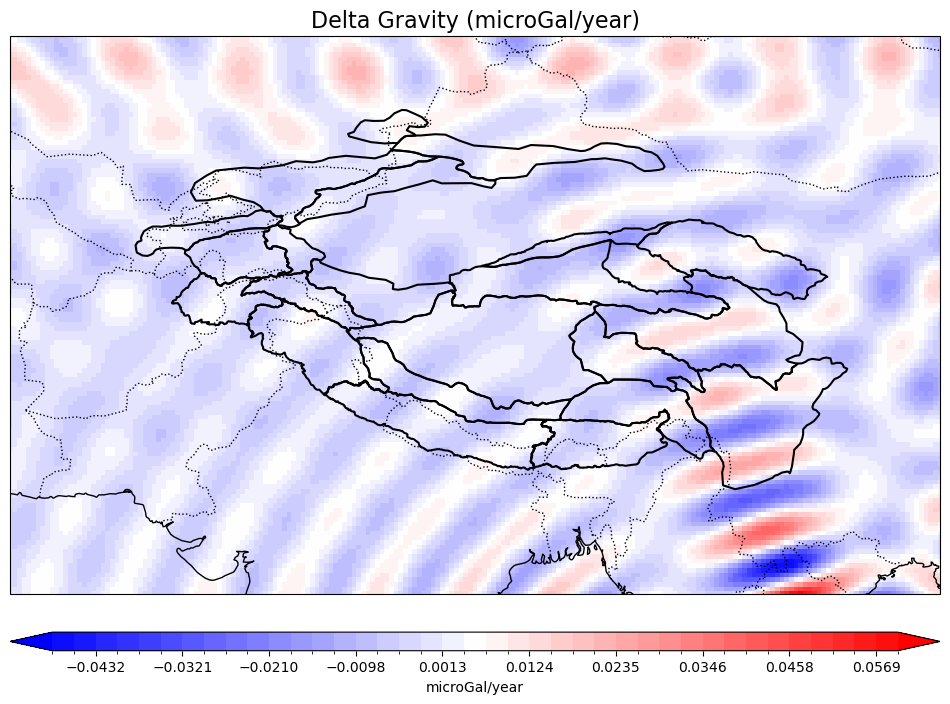

In [295]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import FuncFormatter
import geopandas as gpd
import numpy as np

# --- Load your NetCDF data ---
delta_gravity = xr.open_dataarray('delta_gravity_output_microgal_yr.nc')  # your saved file

# --- Optional: Load your HMA shapefile for boundary plotting---
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# --- Define region of interest (example: HMA region) ---
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# --- Crop data to region of interest ---
cropped = delta_gravity.sel(latitude=slice(lat_min, lat_max), longitude=slice(lon_min, lon_max))

# --- Prepare data for plotting ---
lons = cropped['longitude'].values
lats = cropped['latitude'].values
data = cropped.values
lon2d, lat2d = np.meshgrid(lons, lats)

# Define color levels and colormap (adjust these as needed)
levels = np.linspace(np.nanmin(data), np.nanmax(data), 40)
# levels = [-0.05, -0.04, -0.03, -0.02, -0.01, 0, 0.01, 0.02, 0.03, 0.04, 0.05]
cmap = plt.get_cmap('bwr')
norm = BoundaryNorm(levels, ncolors=cmap.N, extend='both')

# --- Setup the plot ---
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the data
im = ax.pcolormesh(
    lon2d, lat2d, data,
    cmap=cmap, norm=norm,
    # levels=levels,
    shading='auto',
    transform=ccrs.PlateCarree()
)

# Set plot extent to your region of interest
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add shapefile boundaries
for geom in hma_boundary.geometry:
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label(delta_gravity.attrs.get('units', 'Units'))

# Add title
ax.set_title('Delta Gravity (microGal/year)', fontsize=16)

plt.show()

In [296]:
mascon_gravity_signal_mmEWH = mascon_gravity_signal_microgal * 23.86
mascon_gravity_signal_mmEWH

<xarray.DataArray 'delta_gravity' (latitude: 720, longitude: 1440)> Size: 8MB
array([[ 0.04890392,  0.04890392,  0.04890392, ...,  0.04890392,
         0.04890392,  0.04890392],
       [ 0.04878087,  0.04873964,  0.04869834, ...,  0.04890407,
         0.04886308,  0.04882201],
       [ 0.04711302,  0.04703623,  0.04695913, ...,  0.04734157,
         0.04726569,  0.04718951],
       ...,
       [-0.00858349, -0.00871667, -0.00885137, ..., -0.00819309,
        -0.0083217 , -0.00845183],
       [-0.01295913, -0.01305725, -0.01315611, ..., -0.01266919,
        -0.0127651 , -0.01286174],
       [-0.01809069, -0.01814188, -0.01819332, ..., -0.01793849,
        -0.01798899, -0.01803972]], shape=(720, 1440))
Coordinates:
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude  (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8

In [297]:
mascon_gravity_signal_mmEWH.to_netcdf('delta_gravity_output_mmEWH2.nc')

In [298]:
delta_gravity = xr.open_dataarray('delta_gravity_output_mmEWH2.nc')  # your saved file

In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import FuncFormatter
import geopandas as gpd
import numpy as np

# --- Load your NetCDF data ---
d # your saved file

# --- Optional: Load your HMA shapefile for boundary plotting---
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# --- Define region of interest (example: HMA region) ---
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# --- Crop data to region of interest ---
cropped = delta_gravity.sel(latitude=slice(lat_min, lat_max), longitude=slice(lon_min, lon_max))

# --- Prepare data for plotting ---
lons = cropped['longitude'].values
lats = cropped['latitude'].values
data = cropped.values
lon2d, lat2d = np.meshgrid(lons, lats)

# Define color levels and colormap (adjust these as needed)
levels = np.linspace(np.nanmin(data), np.nanmax(data), 21)
cmap = plt.get_cmap('bwr')
norm = BoundaryNorm(levels, ncolors=cmap.N, extend='both')

# --- Setup the plot ---
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the data
im = ax.pcolormesh(
    lon2d, lat2d, data,
    cmap=cmap, norm=norm,
    shading='auto',
    transform=ccrs.PlateCarree()
)

# Set plot extent to your region of interest
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add shapefile boundaries
for geom in hma_boundary.geometry:
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label(delta_gravity.attrs.get('units', 'Units'))

# # Add title
plt.savefig("VLM.png") 

plt.show()

------
------

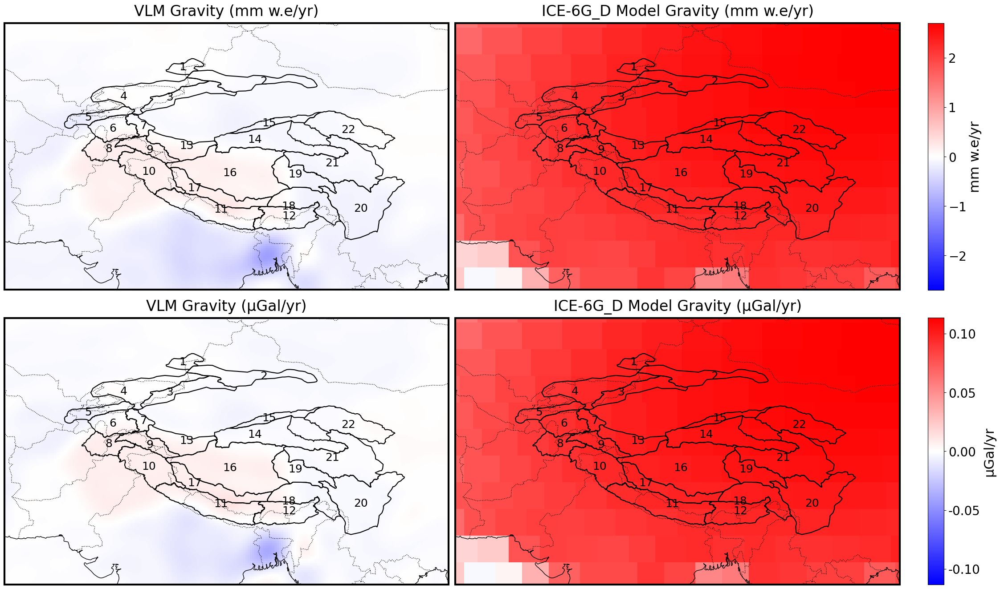

In [73]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm

from matplotlib.colors import TwoSlopeNorm

from matplotlib.ticker import FormatStrFormatter
import geopandas as gpd
import numpy as np
import xarray as xr


# --- Load your datasets and shapefile ---
delta_sigma = xr.open_dataarray('delta_sigma.nc')  # VLM mm w.e./yr
delta_gravity = xr.open_dataarray('delta_gravity_output_microgal_yr.nc')  # VLM microGal/yr
peltier = xr.open_dataset("Tellus_GIA_L3_PELTIER_ICE6G-D_0.5-DEG_v1.0.nc")
peltier_mass = peltier['GIA_mass_rate_3degJPL_MSCN']

# Conversion factor from mm w.e. to microGal approximately
microgal_conversion_factor = 0.042

# Convert Peltier mass: to mm water equivalent (first row), no microGal conversion here
peltier_mass_mm = peltier_mass * 1000

# Convert Peltier mass to microGal (second row)
peltier_mass_microgal = peltier_mass_mm * microgal_conversion_factor  #use stokes coefficients from Peltier's homepage

# Load shapefile
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# Define region of interest
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# Crop datasets region wise

# First row (mm w.e./yr)
cropped_vlm_mmwe = delta_sigma.sel(latitude=slice(lat_min, lat_max), longitude=slice(lon_min, lon_max))
cropped_gia_mmwe = peltier_mass_mm.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))

# Second row (microGal/yr)
cropped_vlm_microgal = delta_gravity.sel(latitude=slice(lat_min, lat_max), longitude=slice(lon_min, lon_max))
cropped_gia_microgal = peltier_mass_microgal.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))

# Prepare meshgrids and data arrays

def prepare_meshgrid_and_data(dataarray, lon_name='longitude', lat_name='latitude'):
    lons = dataarray[lon_name].values
    lats = dataarray[lat_name].values
    data = dataarray.values
    lon2d, lat2d = np.meshgrid(lons, lats)
    return lon2d, lat2d, data

lon2d_vlm_1, lat2d_vlm_1, data_vlm_1 = prepare_meshgrid_and_data(cropped_vlm_mmwe)
lon2d_gia_1, lat2d_gia_1, data_gia_1 = prepare_meshgrid_and_data(cropped_gia_mmwe, lon_name='lon', lat_name='lat')

lon2d_vlm_2, lat2d_vlm_2, data_vlm_2 = prepare_meshgrid_and_data(cropped_vlm_microgal)
lon2d_gia_2, lat2d_gia_2, data_gia_2 = prepare_meshgrid_and_data(cropped_gia_microgal, lon_name='lon', lat_name='lat')

# Compute color normalization for first row (mm w.e./yr)
vmin1 = min(np.nanmin(data_vlm_1), np.nanmin(data_gia_1))
vmax1 = max(np.nanmax(data_vlm_1), np.nanmax(data_gia_1))
levels1 = np.linspace(vmin1, vmax1, 25)
cmap1 = plt.get_cmap('bwr')
norm1 = BoundaryNorm(levels1, ncolors=cmap1.N, extend='both')
######################################################################

# For the first row (mm w.e./yr)
vmin1 = min(np.nanmin(data_vlm_1), np.nanmin(data_gia_1))
vmax1 = max(np.nanmax(data_vlm_1), np.nanmax(data_gia_1))

# Determine the max absolute value for symmetric bounds
abs_max1 = max(abs(vmin1), abs(vmax1))
vmin1_sym, vmax1_sym = -abs_max1, abs_max1

# Set normalization so zero is exactly at center
norm1 = TwoSlopeNorm(vmin=vmin1_sym, vcenter=0, vmax=vmax1_sym)
cmap1 = plt.get_cmap('bwr')

# Similarly for second row (microGal/yr)
vmin2 = min(np.nanmin(data_vlm_2), np.nanmin(data_gia_2))
vmax2 = max(np.nanmax(data_vlm_2), np.nanmax(data_gia_2))
abs_max2 = max(abs(vmin2), abs(vmax2))
vmin2_sym, vmax2_sym = -abs_max2, abs_max2

norm2 = TwoSlopeNorm(vmin=vmin2_sym, vcenter=0, vmax=vmax2_sym)
cmap2 = plt.get_cmap('bwr')

#############################################################################

# Create figure and axes 2 rows x 2 columns
fig, axes = plt.subplots(2, 2, figsize=(24, 24), subplot_kw={'projection': ccrs.PlateCarree()})

# --- First row: VLM (mm w.e./yr) ---
im1 = axes[0, 0].pcolormesh(lon2d_vlm_1, lat2d_vlm_1, data_vlm_1, cmap=cmap1, norm=norm1, shading='auto', transform=ccrs.PlateCarree())
axes[0, 0].set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
axes[0, 0].coastlines()
axes[0, 0].add_feature(cfeature.BORDERS, linestyle=':')
for geom in hma_boundary.geometry:
    axes[0, 0].add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

for idx, row in hma_boundary.iterrows():
            x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
            region_num = row['Region_No']  # Replace with your region number column name
            axes[0, 0].text(x, y, str(region_num), fontsize=18, ha='center', va='center', transform=ccrs.PlateCarree())

axes[0, 0].set_title('VLM Gravity (mm w.e/yr)', fontsize=24, pad=12)
for spine in axes[0, 0].spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')


# --- First row: GIA (mm w.e./yr) ---
im2 = axes[0, 1].pcolormesh(lon2d_gia_1, lat2d_gia_1, data_gia_1, cmap=cmap1, norm=norm1, shading='auto', transform=ccrs.PlateCarree())
axes[0, 1].set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
axes[0, 1].coastlines()
axes[0, 1].add_feature(cfeature.BORDERS, linestyle=':')

for idx, row in hma_boundary.iterrows():
            x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
            region_num = row['Region_No']  # Replace with your region number column name
            axes[0, 1].text(x, y, str(region_num), fontsize=18, ha='center', va='center', transform=ccrs.PlateCarree())


for geom in hma_boundary.geometry:
    axes[0, 1].add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)
    


axes[0, 1].set_title('ICE-6G_D Model Gravity (mm w.e/yr)', fontsize=24, pad=12)
for spine in axes[0, 1].spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')
# gl = axes[0, 1].gridlines(draw_labels=True, linestyle='--', alpha=0.5)
# gl.top_labels = False
# gl.right_labels = False

# Colorbar for first row
fig.subplots_adjust(right=0.85)
# 0.87, 0.13, 0.015, 0.31
cbar_ax1 = fig.add_axes([0.87, 0.478, 0.015, 0.2497])  # smaller height and slightly shifted up
cbar1 = fig.colorbar(im1, cax=cbar_ax1)
cbar1.set_label('mm w.e/yr', fontsize=22)
cbar1.ax.tick_params(labelsize=20)  # Increase font size for cbar1 tick labels
# cbar1.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# --- Second row: VLM Gravity (microGal/yr) ---
im3 = axes[1, 0].pcolormesh(lon2d_vlm_2, lat2d_vlm_2, data_vlm_2, cmap=cmap2, norm=norm2, shading='auto', transform=ccrs.PlateCarree())
axes[1, 0].set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
axes[1, 0].coastlines()

axes[1, 0].add_feature(cfeature.BORDERS, linestyle=':')

for geom in hma_boundary.geometry:
    axes[1, 0].add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

for idx, row in hma_boundary.iterrows():
            x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
            region_num = row['Region_No']  # Replace with your region number column name
            axes[1, 0].text(x, y, str(region_num), fontsize=18, ha='center', va='center', transform=ccrs.PlateCarree())


axes[1, 0].set_title('VLM Gravity (μGal/yr)', fontsize=24, pad=12)

for spine in axes[1, 0].spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')


# --- Second row: GIA Gravity (microGal/yr) ---
im4 = axes[1, 1].pcolormesh(lon2d_gia_2, lat2d_gia_2, data_gia_2, cmap=cmap2, norm=norm2, shading='auto', transform=ccrs.PlateCarree())
axes[1, 1].set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
axes[1, 1].coastlines()
axes[1, 1].add_feature(cfeature.BORDERS, linestyle=':')

for geom in hma_boundary.geometry:
    axes[1, 1].add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

for idx, row in hma_boundary.iterrows():
            x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
            region_num = row['Region_No']  # Replace with your region number column name
            axes[1, 1].text(x, y, str(region_num), fontsize=18, ha='center', va='center', transform=ccrs.PlateCarree())

axes[1, 1].set_title('ICE-6G_D Model Gravity (μGal/yr)', fontsize=24, pad=12)
for spine in axes[1, 1].spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')  # Set


# Colorbar for second row
cbar_ax2 = fig.add_axes([0.87, 0.202, 0.015, 0.2498])  # smaller height and shifted up for second row
cbar2 = fig.colorbar(im3, cax=cbar_ax2)
cbar2.set_label('μGal/yr', fontsize=22)
cbar2.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))


cbar2.ax.tick_params(labelsize=20)  # Increase font size for cbar2 tick labels


fig.subplots_adjust(wspace=-5.5, hspace=-0.5)


plt.tight_layout(rect=[0, 0, 0.85, 0.93])

# fig.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_Maps/VLM_GIA_comparision.png', dpi=500, bbox_inches='tight')
fig.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Figures/Thesis_Maps/VLM_GIA_comparision.svg', dpi=500, bbox_inches='tight')

plt.show()

---
----

In [227]:
mascon_gravity_signal_mmEWH = mascon_gravity_signal_microgal * 23.86
mascon_gravity_signal_mmEWH.attrs['units'] = 'mm w.e/year'
mascon_gravity_signal_mmEWH

<xarray.DataArray 'delta_gravity' (latitude: 720, longitude: 1440)> Size: 8MB
array([[ 0.04890392,  0.04890392,  0.04890392, ...,  0.04890392,
         0.04890392,  0.04890392],
       [ 0.04878087,  0.04873964,  0.04869834, ...,  0.04890407,
         0.04886308,  0.04882201],
       [ 0.04711302,  0.04703623,  0.04695913, ...,  0.04734157,
         0.04726569,  0.04718951],
       ...,
       [-0.00858349, -0.00871667, -0.00885137, ..., -0.00819309,
        -0.0083217 , -0.00845183],
       [-0.01295913, -0.01305725, -0.01315611, ..., -0.01266919,
        -0.0127651 , -0.01286174],
       [-0.01809069, -0.01814188, -0.01819332, ..., -0.01793849,
        -0.01798899, -0.01803972]], shape=(720, 1440))
Coordinates:
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
  * longitude  (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
Attributes:
    units:    mm w.e/year

In [228]:
# Save to NetCDF file
mascon_gravity_signal_mmEWH.to_netcdf('delta_gravity_output_mmEWH1.nc')

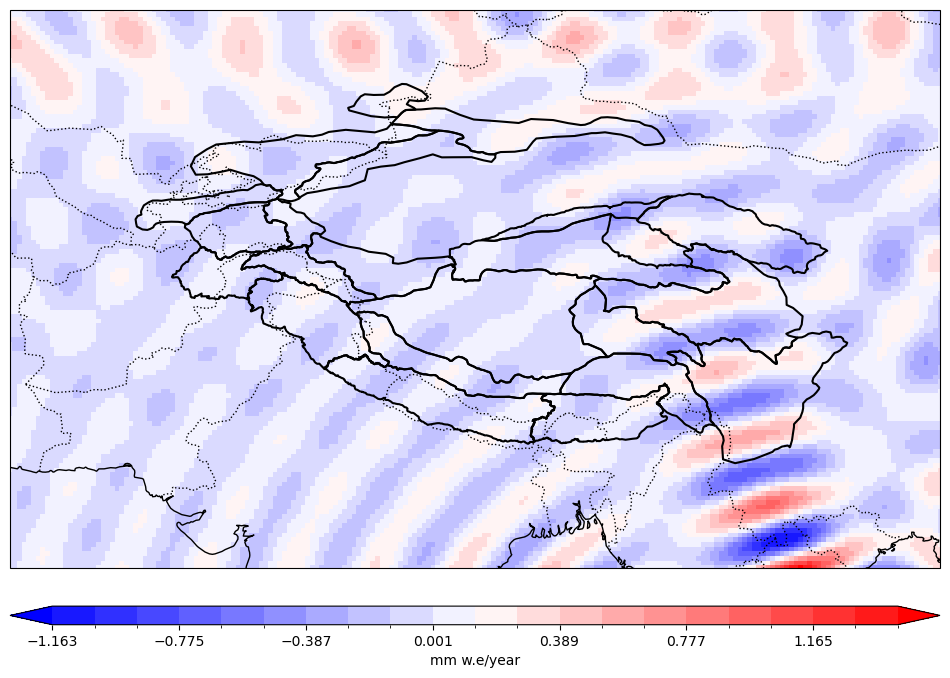

In [254]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import FuncFormatter
import geopandas as gpd
import numpy as np

# --- Load your NetCDF data ---
d # your saved file

# --- Optional: Load your HMA shapefile for boundary plotting---
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# --- Define region of interest (example: HMA region) ---
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# --- Crop data to region of interest ---
cropped = delta_gravity.sel(latitude=slice(lat_min, lat_max), longitude=slice(lon_min, lon_max))

# --- Prepare data for plotting ---
lons = cropped['longitude'].values
lats = cropped['latitude'].values
data = cropped.values
lon2d, lat2d = np.meshgrid(lons, lats)

# Define color levels and colormap (adjust these as needed)
levels = np.linspace(np.nanmin(data), np.nanmax(data), 21)
cmap = plt.get_cmap('bwr')
norm = BoundaryNorm(levels, ncolors=cmap.N, extend='both')

# --- Setup the plot ---
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the data
im = ax.pcolormesh(
    lon2d, lat2d, data,
    cmap=cmap, norm=norm,
    shading='auto',
    transform=ccrs.PlateCarree()
)

# Set plot extent to your region of interest
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add shapefile boundaries
for geom in hma_boundary.geometry:
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label(delta_gravity.attrs.get('units', 'Units'))

# # Add title
plt.savefig("VLM.png") 

plt.show()

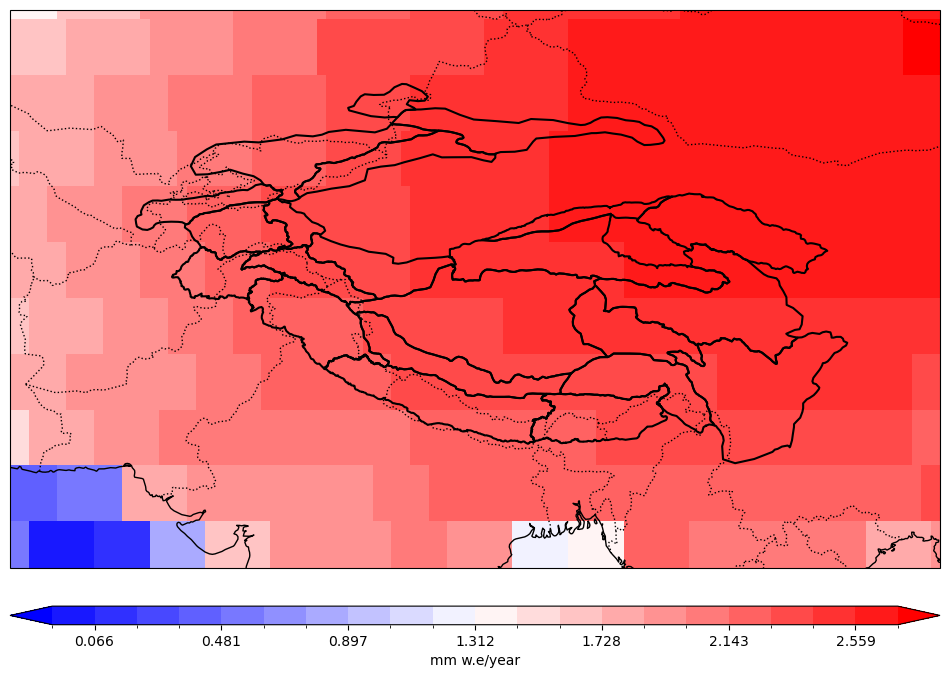

In [255]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import FuncFormatter
import geopandas as gpd
import numpy as np

# --- Load your NetCDF data --- # your saved file

# --- Optional: Load your HMA shapefile for boundary plotting---
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# --- Define region of interest (example: HMA region) ---
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# --- Crop data to region of interest ---
cropped = peltier_mass_mm.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))

# --- Prepare data for plotting ---
lons = cropped['lon'].values
lats = cropped['lat'].values
data = cropped.values
lon2d, lat2d = np.meshgrid(lons, lats)

# Define color levels and colormap (adjust these as needed)
levels = np.linspace(np.nanmin(data), np.nanmax(data), 21)
cmap = plt.get_cmap('bwr')
norm = BoundaryNorm(levels, ncolors=cmap.N, extend='both')

# --- Setup the plot ---
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the data
im = ax.pcolormesh(
    lon2d, lat2d, data,
    cmap=cmap, norm=norm,
    shading='auto',
    transform=ccrs.PlateCarree()
)

# Set plot extent to your region of interest
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add shapefile boundaries
for geom in hma_boundary.geometry:
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label(delta_gravity.attrs.get('units', 'Units'))

plt.savefig("GIA_gravity.png") 
plt.show()

In [249]:
# --- GIA NetCDF files ---
peltier = xr.open_dataset(r"D:\MSRSGI\Masters_thesis\Data\GIA_PGR\Tellus_GIA_L3_PELTIER_ICE6G-D_0.5-DEG_v1.0.nc")

# --- Extract data arrays and convert units (to mm/yr) ---
peltier_mass  = peltier['GIA_mass_rate_3degJPL_MSCN']
peltier_mass

<xarray.DataArray 'GIA_mass_rate_3degJPL_MSCN' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.2 358.8 359.2 359.8
  * lat      (lat) float64 3kB -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
Attributes:
    long_name:        Glacial Isostatic Adjustment - corrections for GRACE & ...
    valid_min:        -0.01
    valid_max:        0.05
    comment:          Model: ICE-6G_D (VM5a) O(512)
    comment_summary:  Peltier (Ice-6G_D (updated; 06/2017!))
    type:             mass
    units:            m/year

In [250]:
peltier_mass.values

array([[-0.00063039, -0.00063039, -0.00063039, ..., -0.00063039,
        -0.00063039, -0.00063039],
       [-0.00063039, -0.00063039, -0.00063039, ..., -0.00063039,
        -0.00063039, -0.00063039],
       [-0.00063039, -0.00063039, -0.00063039, ..., -0.00063039,
        -0.00063039, -0.00063039],
       ...,
       [-0.00457588, -0.00457588, -0.00457588, ..., -0.00457588,
        -0.00457588, -0.00457588],
       [-0.00457588, -0.00457588, -0.00457588, ..., -0.00457588,
        -0.00457588, -0.00457588],
       [-0.00457588, -0.00457588, -0.00457588, ..., -0.00457588,
        -0.00457588, -0.00457588]], shape=(360, 720))

In [251]:
peltier_mass_mm = peltier_mass*1000
peltier_mass_mm

<xarray.DataArray 'GIA_mass_rate_3degJPL_MSCN' (lat: 360, lon: 720)> Size: 2MB
array([[-0.63039046, -0.63039046, -0.63039046, ..., -0.63039046,
        -0.63039046, -0.63039046],
       [-0.63039046, -0.63039046, -0.63039046, ..., -0.63039046,
        -0.63039046, -0.63039046],
       [-0.63039046, -0.63039046, -0.63039046, ..., -0.63039046,
        -0.63039046, -0.63039046],
       ...,
       [-4.57587753, -4.57587753, -4.57587753, ..., -4.57587753,
        -4.57587753, -4.57587753],
       [-4.57587753, -4.57587753, -4.57587753, ..., -4.57587753,
        -4.57587753, -4.57587753],
       [-4.57587753, -4.57587753, -4.57587753, ..., -4.57587753,
        -4.57587753, -4.57587753]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.2 358.8 359.2 359.8
  * lat      (lat) float64 3kB -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75

-----
-----

In [195]:
# Suppose your DataArray is named delta_gravity   #MicroGAL EXPORTED  to netCDF file 

# Save to NetCDF file
mascon_gravity_signal_microgal.to_netcdf('delta_gravity_output.nc')

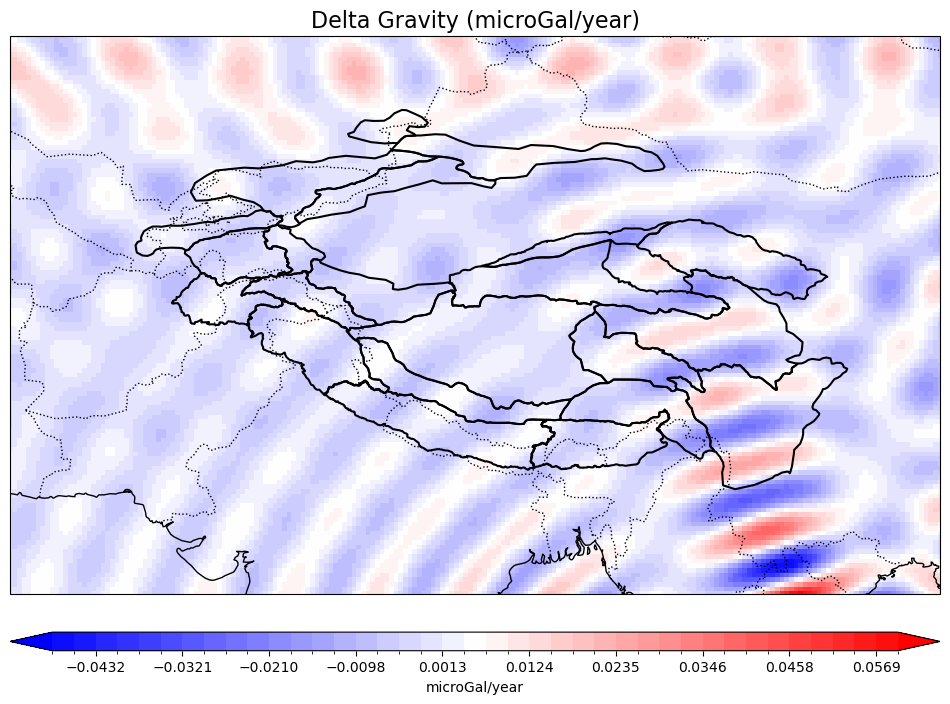

In [209]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import FuncFormatter
import geopandas as gpd
import numpy as np

# --- Load your NetCDF data ---
delta_gravity = xr.open_dataarray('delta_gravity_output.nc')  # your saved file

# --- Optional: Load your HMA shapefile for boundary plotting---
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# --- Define region of interest (example: HMA region) ---
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# --- Crop data to region of interest ---
cropped = delta_gravity.sel(latitude=slice(lat_min, lat_max), longitude=slice(lon_min, lon_max))

# --- Prepare data for plotting ---
lons = cropped['longitude'].values
lats = cropped['latitude'].values
data = cropped.values
lon2d, lat2d = np.meshgrid(lons, lats)

# Define color levels and colormap (adjust these as needed)
levels = np.linspace(np.nanmin(data), np.nanmax(data), 40)
# levels = [-0.05, -0.04, -0.03, -0.02, -0.01, 0, 0.01, 0.02, 0.03, 0.04, 0.05]
cmap = plt.get_cmap('bwr')
norm = BoundaryNorm(levels, ncolors=cmap.N, extend='both')

# --- Setup the plot ---
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the data
im = ax.pcolormesh(
    lon2d, lat2d, data,
    cmap=cmap, norm=norm,
    # levels=levels,
    shading='auto',
    transform=ccrs.PlateCarree()
)

# Set plot extent to your region of interest
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add shapefile boundaries
for geom in hma_boundary.geometry:
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label(delta_gravity.attrs.get('units', 'Units'))

# Add title
ax.set_title('Delta Gravity (microGal/year)', fontsize=16)

plt.show()

------
-------

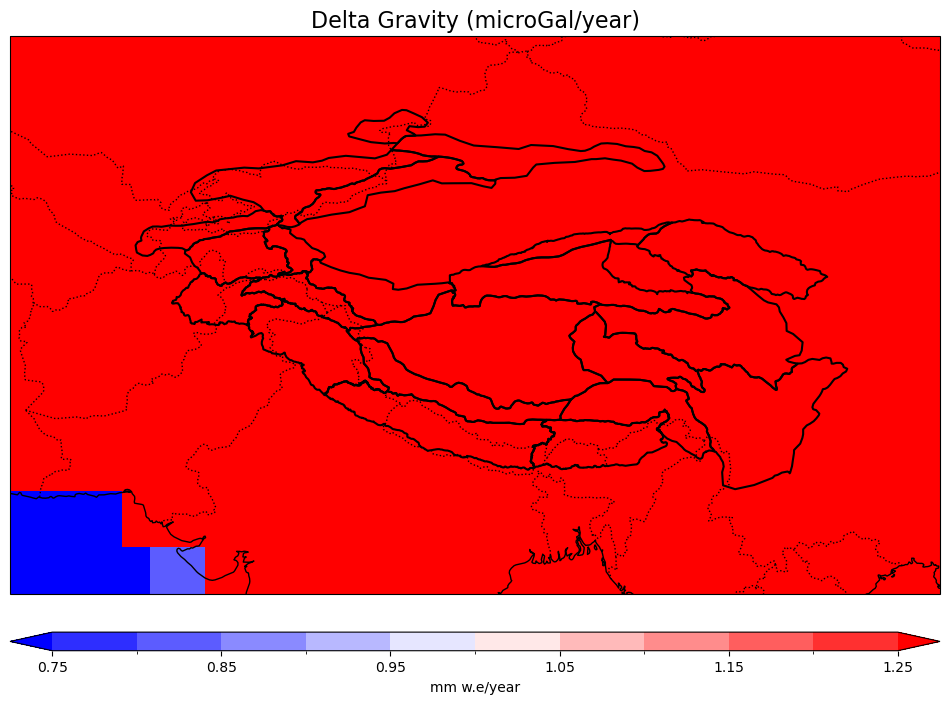

In [239]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
import geopandas as gpd
import numpy as np

# Load shapefile and convert CRS
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# Region of interest
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# Load Peltier dataset
peltier = xr.open_dataset(r"D:\MSRSGI\Masters_thesis\Data\GIA_PGR\Tellus_GIA_L3_PELTIER_ICE6G-D_0.5-DEG_v1.0.nc")

# Extract mass rate and convert units to mm/yr
peltier_mass = (peltier['GIA_mass_rate_3degJPL_MSCN']) * 1000

# Crop to region of interest
cropped = peltier_mass.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))

# Prepare data for plotting
lons = cropped['lon'].values
lats = cropped['lat'].values
data = cropped.values
lon2d, lat2d = np.meshgrid(lons, lats)

# Define color levels and colormap (adjust these as needed)
# levels = [0.75, 0.80, 0.85, 0.90, 0.95, 1.0, 1.05, 1.1, 1.15, 1.2, 1.25]
# levels = [-0.05, -0.04, -0.03, -0.02, -0.01, 0, 0.01, 0.02, 0.03, 0.04, 0.05]
# levels = np.linspace(np.nanmin(peltier_mass), np.nanmax(peltier_mass), 21)
levels_mass = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
cmap = plt.get_cmap('bwr')
norm = BoundaryNorm(levels, ncolors=cmap.N, extend='both')

# --- Setup the plot ---
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the data
im = ax.pcolormesh(
    lon2d, lat2d, data,
    cmap=cmap, norm=norm,
    #levels=levels,
    shading='auto',
    transform=ccrs.PlateCarree()
)

# Set plot extent to your region of interest
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add shapefile boundaries
for geom in hma_boundary.geometry:
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

# Add coastlines and borders
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=50)
cbar.set_label(delta_gravity.attrs.get('units', 'Units'))

# Add title
ax.set_title('Delta Gravity (microGal/year)', fontsize=16)

plt.show()

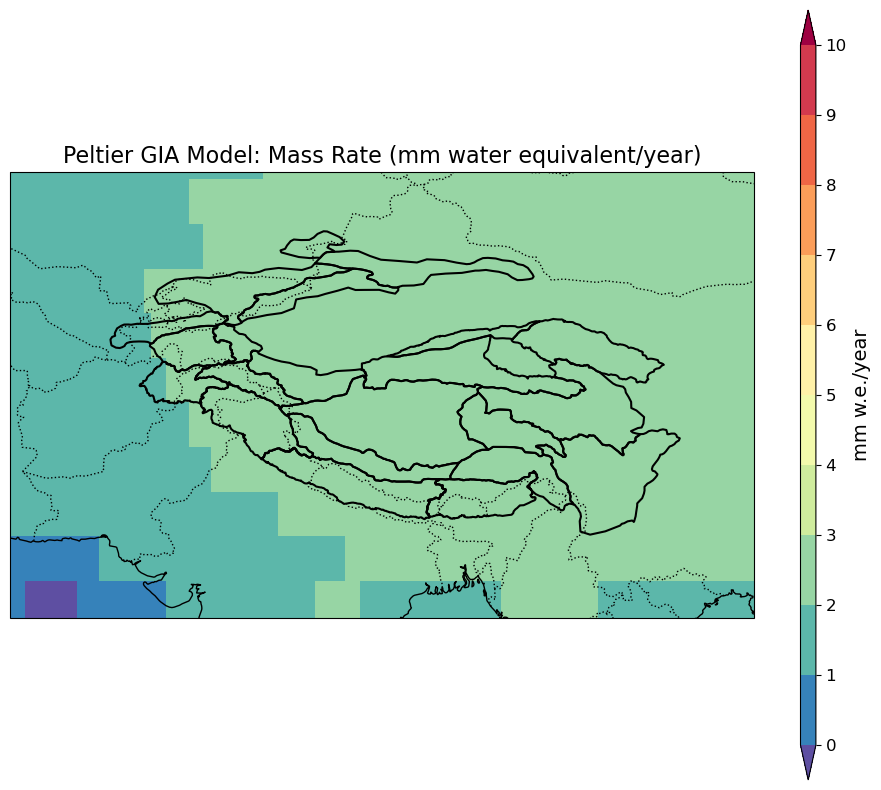

In [246]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
import geopandas as gpd
import numpy as np

# --- File paths and shapefile ---
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# --- GIA NetCDF files ---
peltier = xr.open_dataset(r"D:\MSRSGI\Masters_thesis\Data\GIA_PGR\Tellus_GIA_L3_PELTIER_ICE6G-D_0.5-DEG_v1.0.nc")
# caron   = xr.open_dataset(r"D:\MSRSGI\Masters_thesis\Data\GIA_PGR\Tellus_GIA_L3_CARON-2018_0.5-DEG_v1.0.nc")
# wahr    = xr.open_dataset(r"D:\MSRSGI\Masters_thesis\Data\GIA_PGR\Tellus_GIA_L3_A-WAHR_ICE5G-VM2_0.5-DEG_v1.0.nc")


# --- Extract data arrays and convert units (to mm/yr) ---
peltier_mass  = peltier['GIA_mass_rate_3degJPL_MSCN'] * 1000 * 0.04 * 23.86

# Region boundaries
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# Use peltier mass rate already in mm/year
data = peltier_mass.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))
lons = data['lon'].values
lats = data['lat'].values
values = data.values

# Define color levels and colormap as before
# levels_mass = np.linspace(np.nanmin(peltier_mass), np.nanmax(peltier_mass), 21)
levels_mass = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
cmap_mass = plt.get_cmap("Spectral_r")
norm_mass = BoundaryNorm(levels_mass, ncolors=cmap_mass.N, extend='both')

fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

lon2d, lat2d = np.meshgrid(lons, lats)
im = ax.pcolormesh(lon2d, lat2d, values, cmap=cmap_mass, norm=norm_mass,
                   transform=ccrs.PlateCarree(), shading='auto')

ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add HMA boundary
for geom in hma_boundary.geometry:
    ax.add_geometries([geom], crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=1.5)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Peltier GIA Model: Mass Rate (mm water equivalent/year)', fontsize=16)

# Add colorbar
cbar = fig.colorbar(im, orientation='vertical', pad=0.05, aspect=50, ticks=levels_mass, extend='both')
cbar.set_label('mm w.e./year', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.show()